In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.callbacks import LambdaCallback
from sklearn.manifold import TSNE


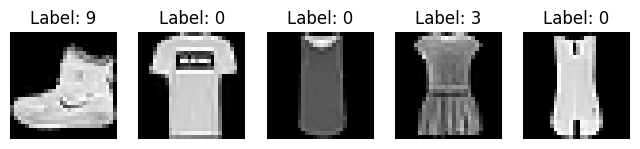

In [2]:
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

# Normalize and reshape the data
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train.reshape((-1, 28, 28, 1))
x_test = x_test.reshape((-1, 28, 28, 1))

# Display the first few images
def plot_images(images, labels, columns=5):
    plt.figure(figsize=(8, 2))
    for i in range(columns):
        ax = plt.subplot(1, columns, i + 1)
        plt.imshow(images[i].reshape(28,28), cmap='gray')
        ax.title.set_text(f'Label: {labels[i]}')
        plt.axis('off')
    plt.show()

plot_images(x_train, y_train)


In [3]:
import tensorflow as tf
from tensorflow.keras import layers, models

latent_dim = 128  # Larger latent space for better representation

class Sampling(layers.Layer):
    """Reparameterization trick: Uses (z_mean, z_log_var) to sample latent z"""
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# Build Encoder with Residual Blocks
def build_encoder():
    encoder_inputs = layers.Input(shape=(28, 28, 1))
    x = layers.Conv2D(64, 3, strides=1, padding='same')(encoder_inputs)
    x = layers.LeakyReLU()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(256, 3, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Flatten()(x)
    x = layers.Dense(256, activation='relu')(x)

    z_mean = layers.Dense(latent_dim, name='z_mean')(x)
    z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
    z = Sampling()([z_mean, z_log_var])

    return models.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")

# Build Decoder with Residual Blocks
def build_decoder():
    latent_inputs = layers.Input(shape=(latent_dim,))
    x = layers.Dense(7 * 7 * 256, activation='relu')(latent_inputs)
    x = layers.Reshape((7, 7, 256))(x)

    x = layers.Conv2DTranspose(256, 3, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2DTranspose(64, 3, strides=1, padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.BatchNormalization()(x)

    decoder_outputs = layers.Conv2DTranspose(1, 3, activation='sigmoid', padding='same')(x)

    return models.Model(latent_inputs, decoder_outputs, name="decoder")

# Create Encoder and Decoder
encoder = build_encoder()
decoder = build_decoder()



In [4]:
# Define the VAE model
class VAE(models.Model):
    def __init__(self, encoder, decoder, beta=4.0, **kwargs):  # Higher beta for better disentanglement
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.beta = beta

    def call(self, inputs):
        z_mean, z_log_var, z = self.encoder(inputs)
        reconstructed = self.decoder(z)
        kl_loss = self.beta * -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
        self.add_loss(kl_loss)
        return reconstructed


    def train_step(self, data):
        # Check if data is in tuple form (which includes data and labels), and extract only the data part
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(data, reconstruction, from_logits=True))
            kl_loss = -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss
        }

    def test_step(self, data):
        # Similarly, ensure only the data part is used for validation steps
        if isinstance(data, tuple):
            data = data[0]
        z_mean, z_log_var, z = self.encoder(data)
        reconstruction = self.decoder(z)
        reconstruction_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(data, reconstruction, from_logits=True))
        kl_loss = -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        total_loss = reconstruction_loss + kl_loss
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss
        }

# Instantiate and Compile the VAE
vae = VAE(encoder, decoder)
vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss=tf.keras.losses.MeanSquaredError())



Epoch 1/200


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:780: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


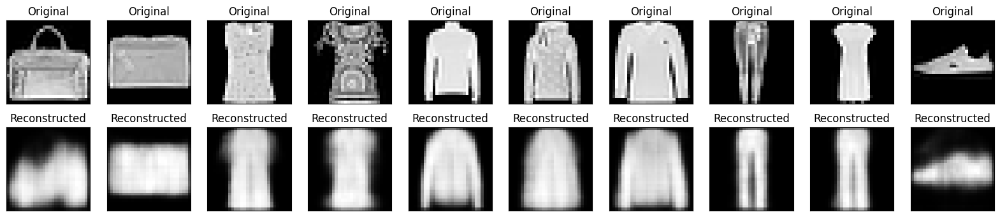

469/469 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - kl_loss: 0.5352 - loss: 0.9223 - reconstruction_loss: 0.3871 - val_kl_loss: 0.5423 - val_loss: 0.8717 - val_reconstruction_loss: 0.3294
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


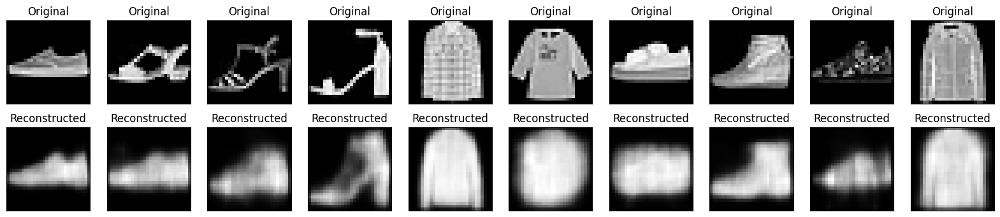

469/469 ━━━━━━━━━━━━━━━━━━━━ 61s 61ms/step - kl_loss: 0.5369 - loss: 0.8827 - reconstruction_loss: 0.3458 - val_kl_loss: 0.5386 - val_loss: 0.8704 - val_reconstruction_loss: 0.3318
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


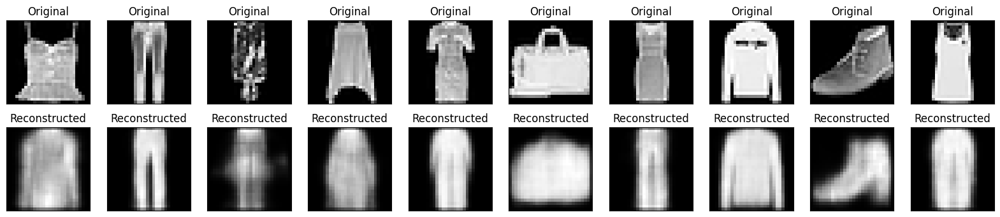

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5365 - loss: 0.8758 - reconstruction_loss: 0.3393 - val_kl_loss: 0.5364 - val_loss: 0.8457 - val_reconstruction_loss: 0.3093
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


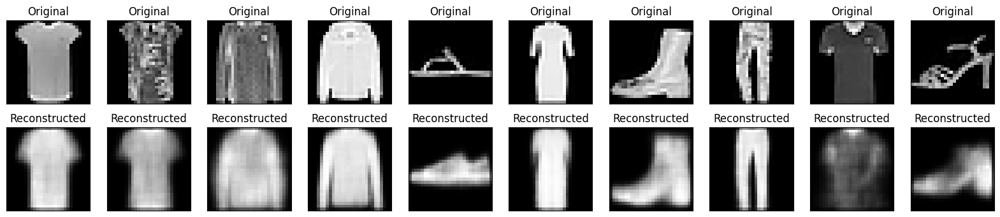

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - kl_loss: 0.5367 - loss: 0.8714 - reconstruction_loss: 0.3347 - val_kl_loss: 0.5381 - val_loss: 0.8522 - val_reconstruction_loss: 0.3141
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


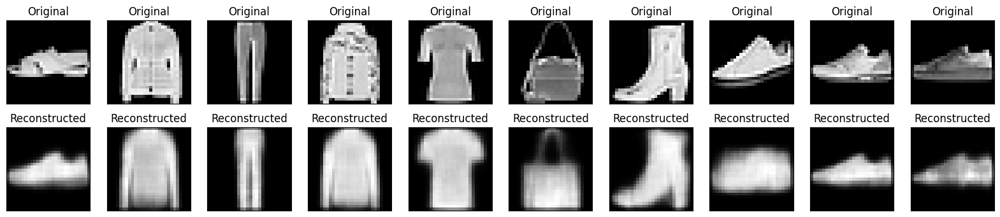

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - kl_loss: 0.5371 - loss: 0.8685 - reconstruction_loss: 0.3314 - val_kl_loss: 0.5369 - val_loss: 0.8489 - val_reconstruction_loss: 0.3120
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


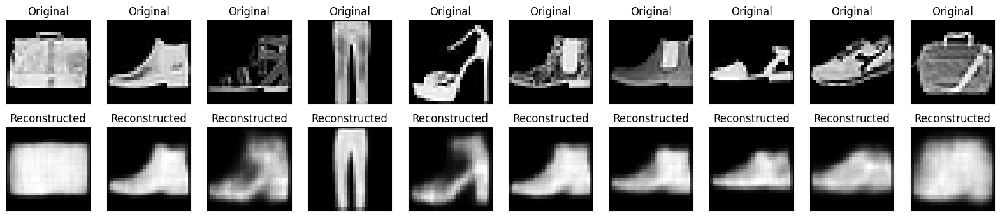

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5374 - loss: 0.8662 - reconstruction_loss: 0.3288 - val_kl_loss: 0.5383 - val_loss: 0.8448 - val_reconstruction_loss: 0.3065
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


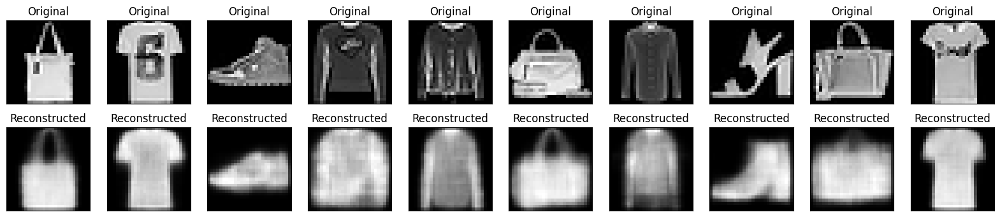

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - kl_loss: 0.5380 - loss: 0.8647 - reconstruction_loss: 0.3267 - val_kl_loss: 0.5395 - val_loss: 0.8523 - val_reconstruction_loss: 0.3128
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


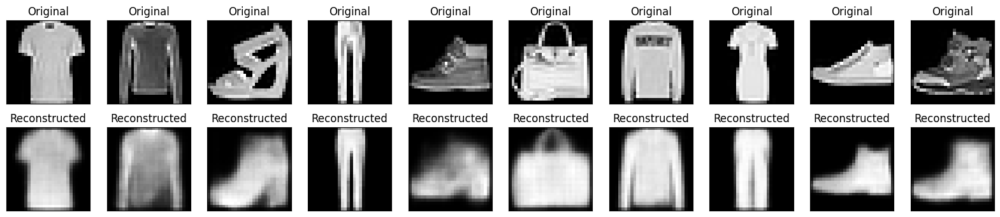

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5383 - loss: 0.8634 - reconstruction_loss: 0.3251 - val_kl_loss: 0.5414 - val_loss: 0.8488 - val_reconstruction_loss: 0.3074
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


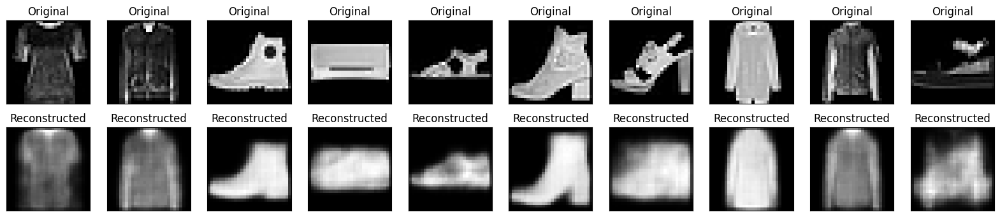

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - kl_loss: 0.5385 - loss: 0.8624 - reconstruction_loss: 0.3239 - val_kl_loss: 0.5389 - val_loss: 0.8440 - val_reconstruction_loss: 0.3051
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


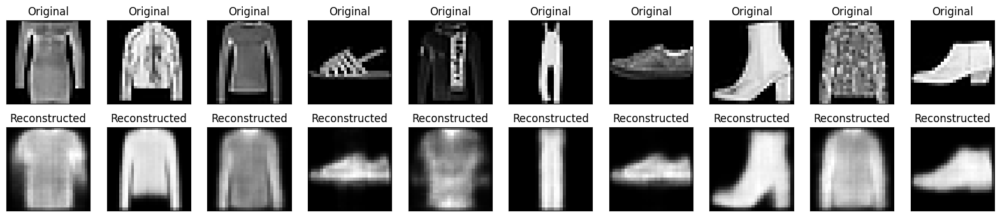

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step - kl_loss: 0.5387 - loss: 0.8616 - reconstruction_loss: 0.3229 - val_kl_loss: 0.5375 - val_loss: 0.8421 - val_reconstruction_loss: 0.3046
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


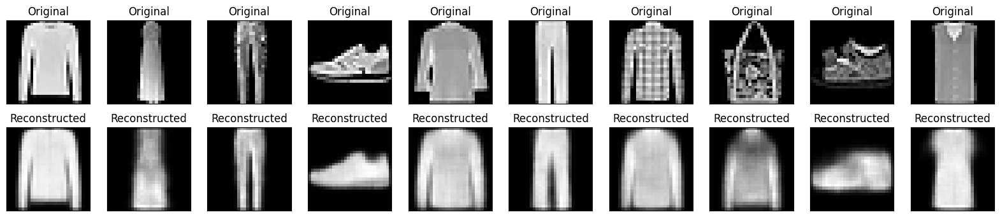

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5390 - loss: 0.8613 - reconstruction_loss: 0.3223 - val_kl_loss: 0.5414 - val_loss: 0.8449 - val_reconstruction_loss: 0.3035
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


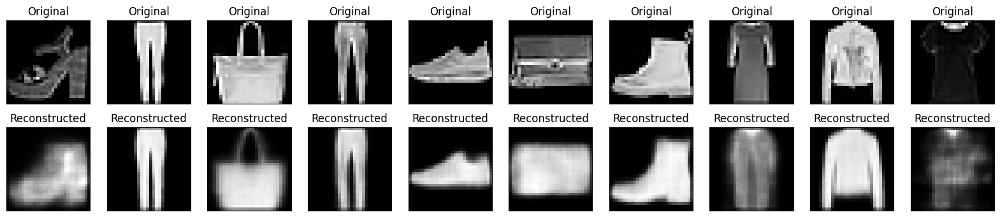

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5391 - loss: 0.8606 - reconstruction_loss: 0.3215 - val_kl_loss: 0.5412 - val_loss: 0.8437 - val_reconstruction_loss: 0.3025
Epoch 13/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


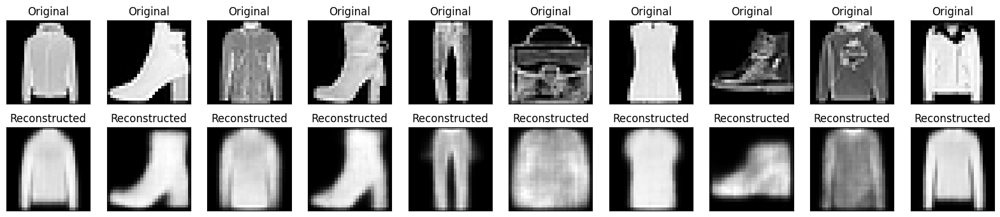

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5393 - loss: 0.8601 - reconstruction_loss: 0.3207 - val_kl_loss: 0.5391 - val_loss: 0.8387 - val_reconstruction_loss: 0.2996
Epoch 14/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


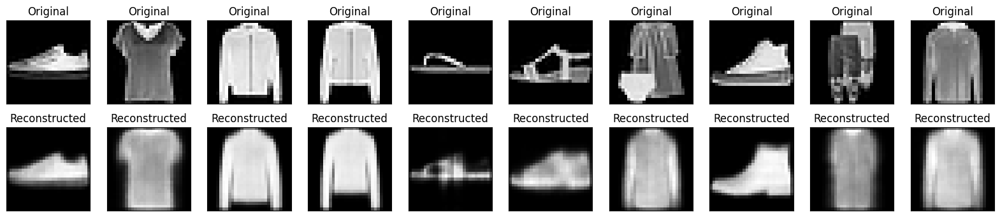

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5395 - loss: 0.8598 - reconstruction_loss: 0.3203 - val_kl_loss: 0.5410 - val_loss: 0.8398 - val_reconstruction_loss: 0.2988
Epoch 15/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


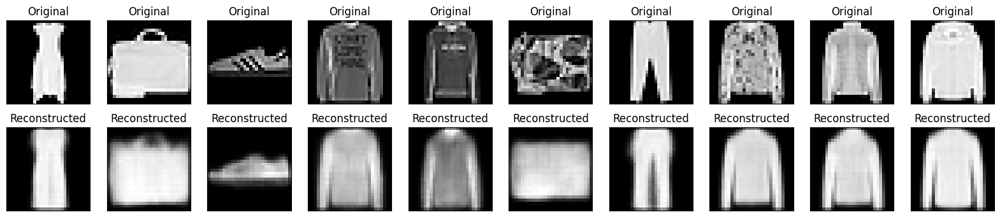

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5396 - loss: 0.8595 - reconstruction_loss: 0.3198 - val_kl_loss: 0.5416 - val_loss: 0.8396 - val_reconstruction_loss: 0.2980
Epoch 16/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


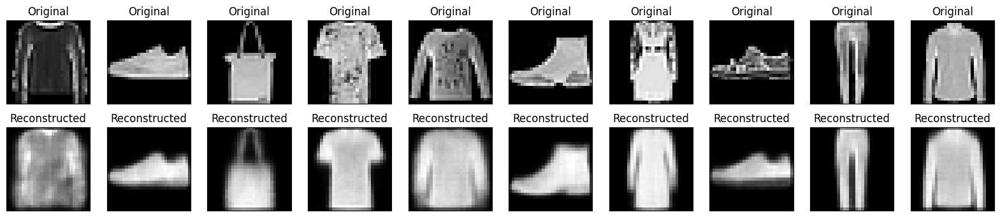

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5397 - loss: 0.8591 - reconstruction_loss: 0.3194 - val_kl_loss: 0.5409 - val_loss: 0.8428 - val_reconstruction_loss: 0.3019
Epoch 17/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


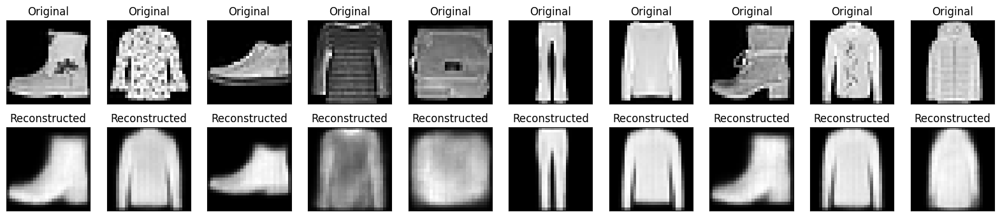

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5398 - loss: 0.8588 - reconstruction_loss: 0.3190 - val_kl_loss: 0.5411 - val_loss: 0.8433 - val_reconstruction_loss: 0.3022
Epoch 18/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


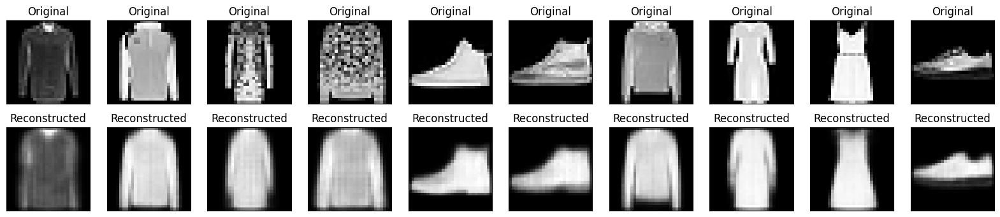

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5400 - loss: 0.8587 - reconstruction_loss: 0.3186 - val_kl_loss: 0.5430 - val_loss: 0.8407 - val_reconstruction_loss: 0.2977
Epoch 19/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


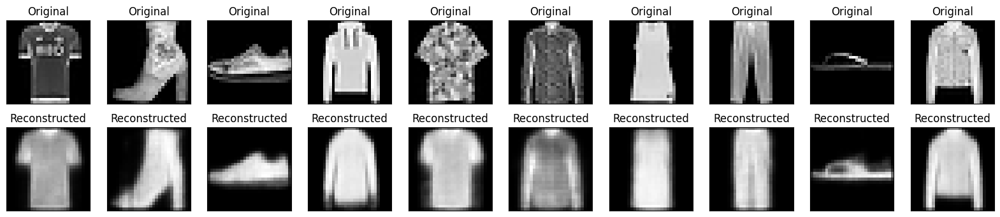

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5401 - loss: 0.8583 - reconstruction_loss: 0.3183 - val_kl_loss: 0.5400 - val_loss: 0.8365 - val_reconstruction_loss: 0.2965
Epoch 20/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


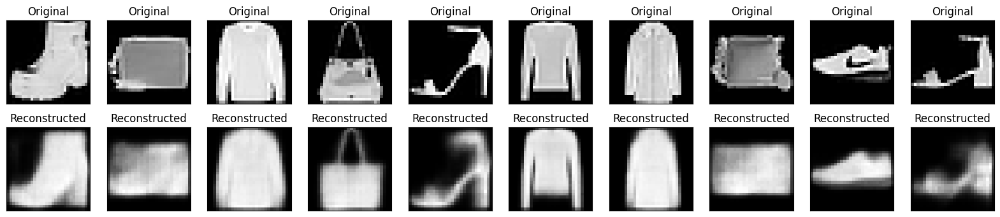

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5402 - loss: 0.8582 - reconstruction_loss: 0.3180 - val_kl_loss: 0.5397 - val_loss: 0.8392 - val_reconstruction_loss: 0.2995
Epoch 21/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


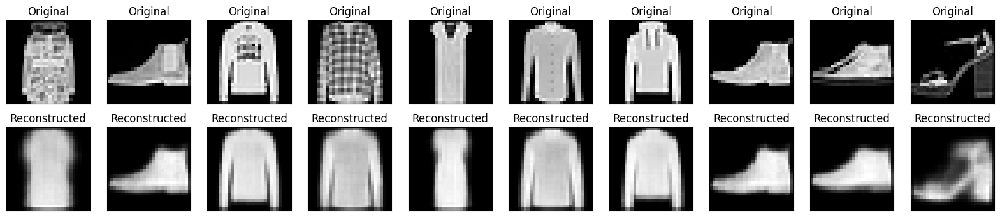

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5403 - loss: 0.8579 - reconstruction_loss: 0.3176 - val_kl_loss: 0.5405 - val_loss: 0.8421 - val_reconstruction_loss: 0.3015
Epoch 22/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


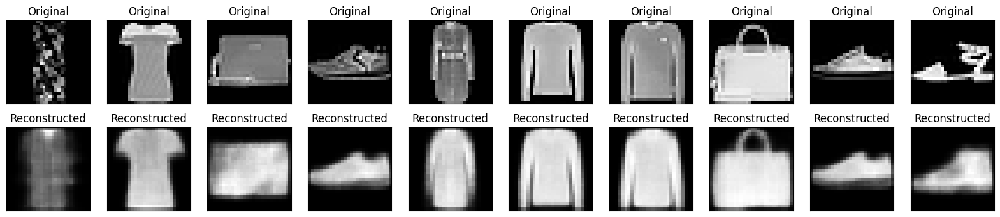

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5404 - loss: 0.8577 - reconstruction_loss: 0.3173 - val_kl_loss: 0.5409 - val_loss: 0.8383 - val_reconstruction_loss: 0.2975
Epoch 23/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


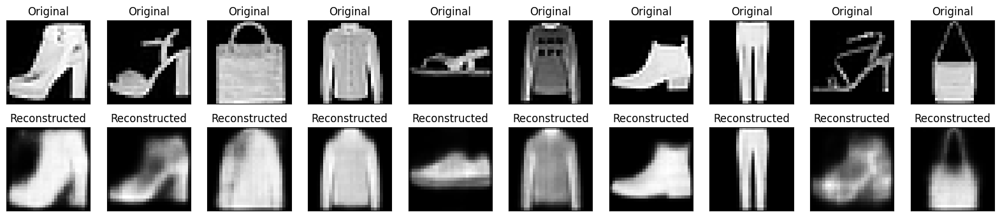

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - kl_loss: 0.5404 - loss: 0.8577 - reconstruction_loss: 0.3173 - val_kl_loss: 0.5412 - val_loss: 0.8453 - val_reconstruction_loss: 0.3042
Epoch 24/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


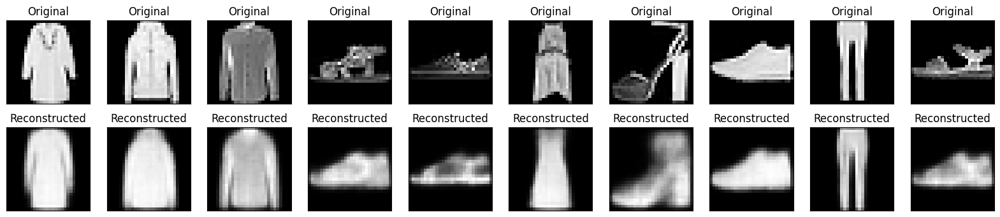

469/469 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step - kl_loss: 0.5404 - loss: 0.8572 - reconstruction_loss: 0.3168 - val_kl_loss: 0.5411 - val_loss: 0.8401 - val_reconstruction_loss: 0.2990
Epoch 25/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


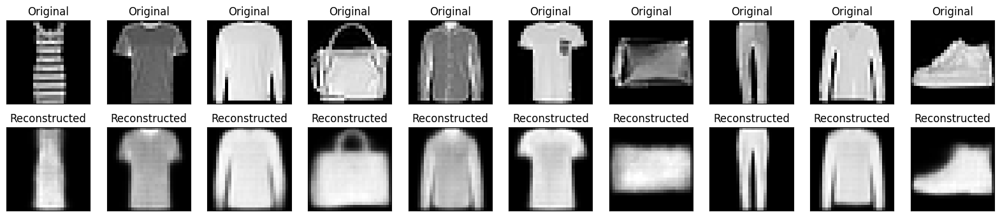

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5406 - loss: 0.8571 - reconstruction_loss: 0.3166 - val_kl_loss: 0.5415 - val_loss: 0.8358 - val_reconstruction_loss: 0.2943
Epoch 26/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


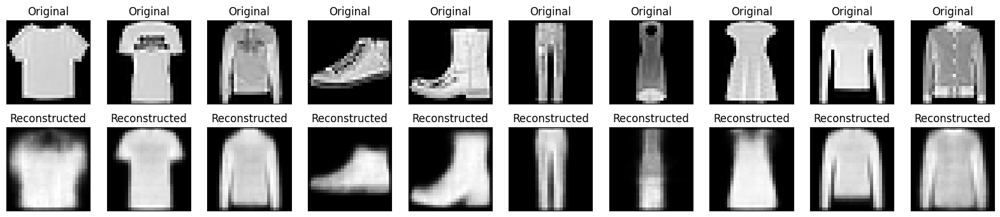

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5406 - loss: 0.8571 - reconstruction_loss: 0.3165 - val_kl_loss: 0.5424 - val_loss: 0.8425 - val_reconstruction_loss: 0.3001
Epoch 27/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


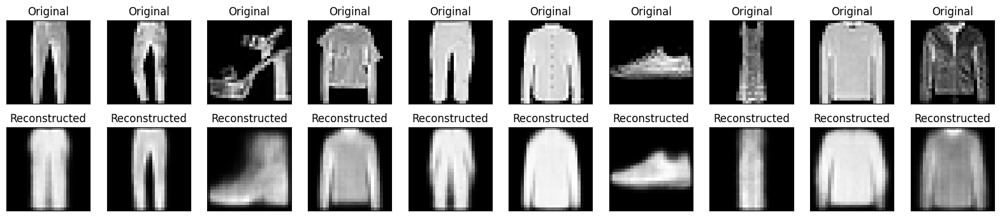

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5406 - loss: 0.8570 - reconstruction_loss: 0.3163 - val_kl_loss: 0.5406 - val_loss: 0.8393 - val_reconstruction_loss: 0.2987
Epoch 28/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


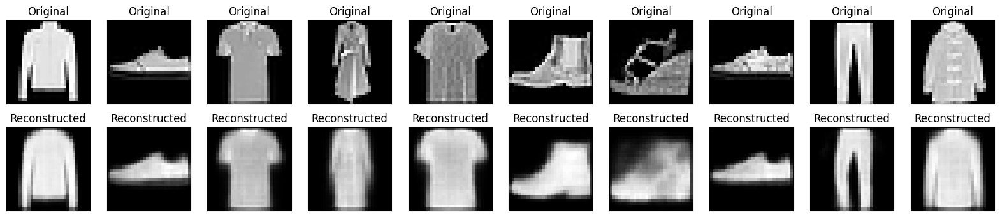

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5407 - loss: 0.8569 - reconstruction_loss: 0.3161 - val_kl_loss: 0.5424 - val_loss: 0.8420 - val_reconstruction_loss: 0.2996
Epoch 29/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


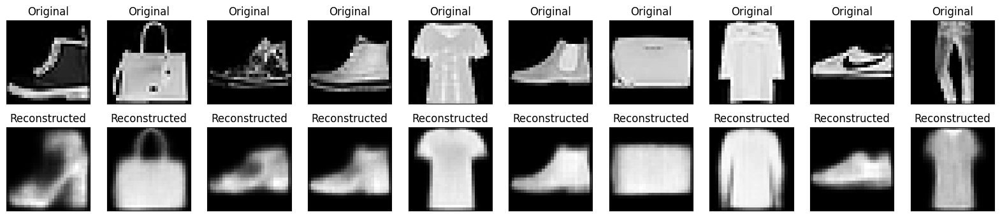

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5409 - loss: 0.8568 - reconstruction_loss: 0.3159 - val_kl_loss: 0.5406 - val_loss: 0.8427 - val_reconstruction_loss: 0.3020
Epoch 30/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


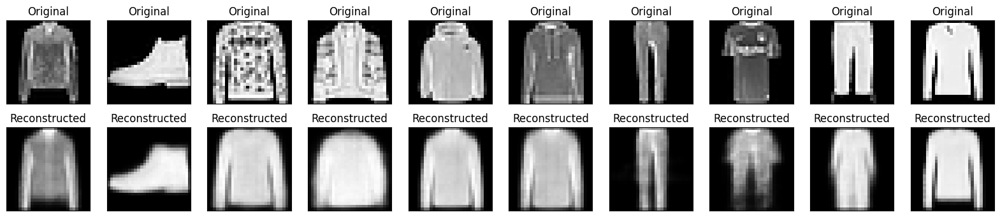

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5408 - loss: 0.8565 - reconstruction_loss: 0.3157 - val_kl_loss: 0.5416 - val_loss: 0.8381 - val_reconstruction_loss: 0.2965
Epoch 31/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


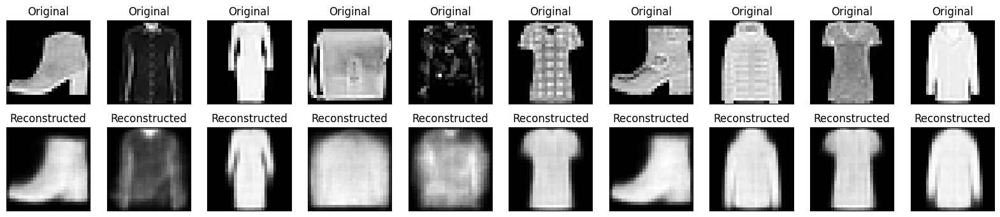

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5409 - loss: 0.8565 - reconstruction_loss: 0.3156 - val_kl_loss: 0.5425 - val_loss: 0.8372 - val_reconstruction_loss: 0.2947
Epoch 32/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


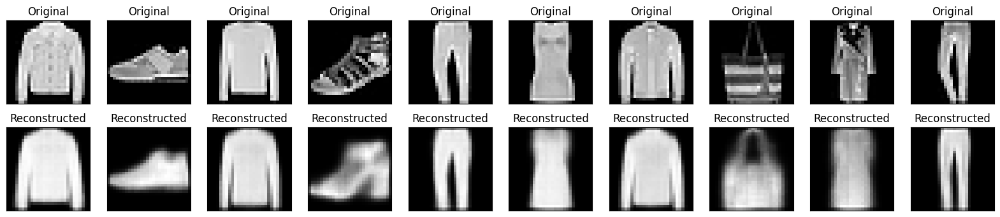

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5409 - loss: 0.8563 - reconstruction_loss: 0.3154 - val_kl_loss: 0.5405 - val_loss: 0.8434 - val_reconstruction_loss: 0.3029
Epoch 33/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


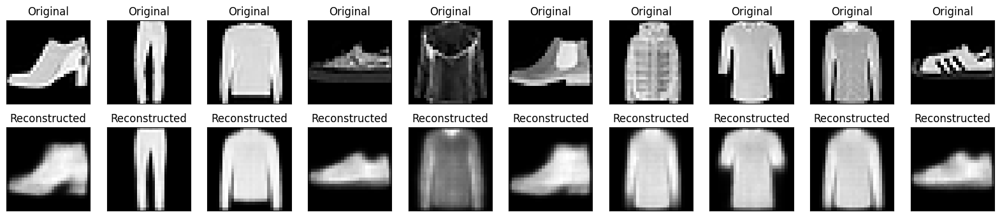

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5411 - loss: 0.8563 - reconstruction_loss: 0.3153 - val_kl_loss: 0.5414 - val_loss: 0.8363 - val_reconstruction_loss: 0.2949
Epoch 34/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


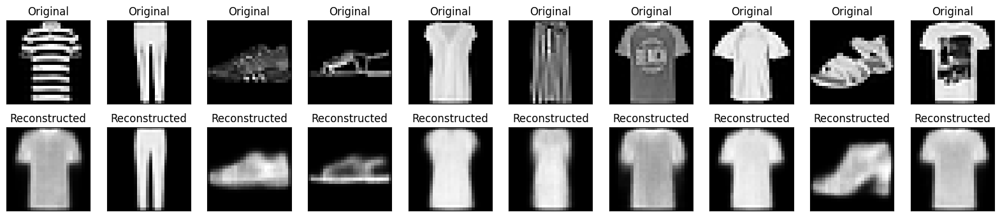

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5411 - loss: 0.8563 - reconstruction_loss: 0.3152 - val_kl_loss: 0.5405 - val_loss: 0.8383 - val_reconstruction_loss: 0.2977
Epoch 35/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


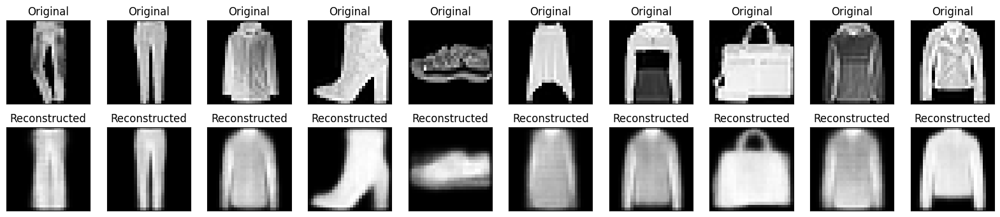

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5411 - loss: 0.8562 - reconstruction_loss: 0.3151 - val_kl_loss: 0.5403 - val_loss: 0.8396 - val_reconstruction_loss: 0.2993
Epoch 36/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


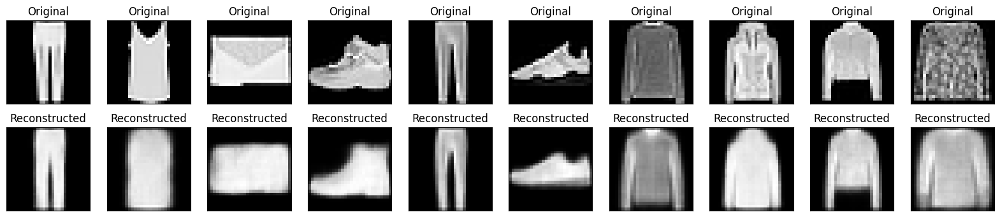

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - kl_loss: 0.5412 - loss: 0.8560 - reconstruction_loss: 0.3148 - val_kl_loss: 0.5412 - val_loss: 0.8441 - val_reconstruction_loss: 0.3029
Epoch 37/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


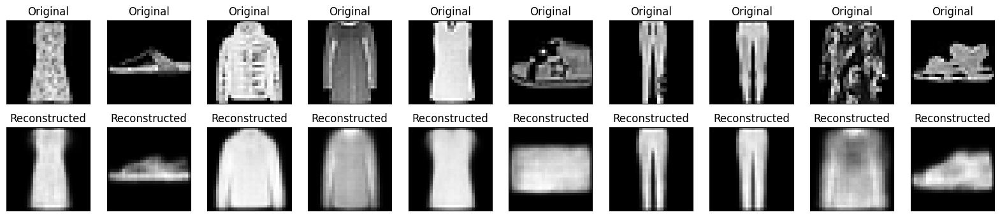

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5412 - loss: 0.8560 - reconstruction_loss: 0.3148 - val_kl_loss: 0.5405 - val_loss: 0.8423 - val_reconstruction_loss: 0.3018
Epoch 38/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


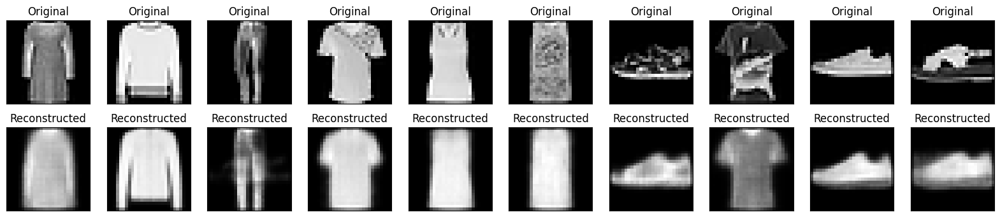

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - kl_loss: 0.5412 - loss: 0.8558 - reconstruction_loss: 0.3146 - val_kl_loss: 0.5407 - val_loss: 0.8424 - val_reconstruction_loss: 0.3017
Epoch 39/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


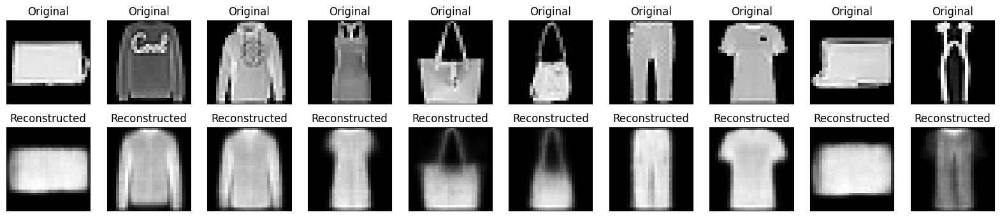

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5413 - loss: 0.8558 - reconstruction_loss: 0.3145 - val_kl_loss: 0.5409 - val_loss: 0.8360 - val_reconstruction_loss: 0.2952
Epoch 40/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


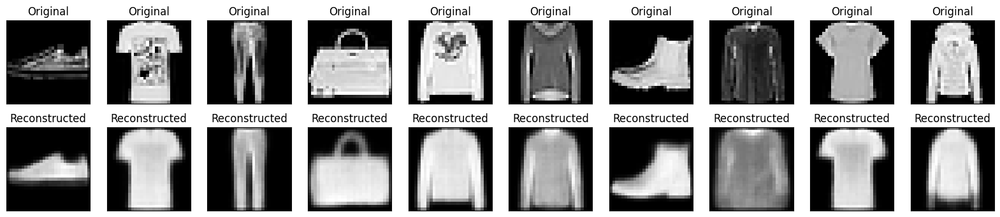

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - kl_loss: 0.5414 - loss: 0.8559 - reconstruction_loss: 0.3145 - val_kl_loss: 0.5414 - val_loss: 0.8341 - val_reconstruction_loss: 0.2926
Epoch 41/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


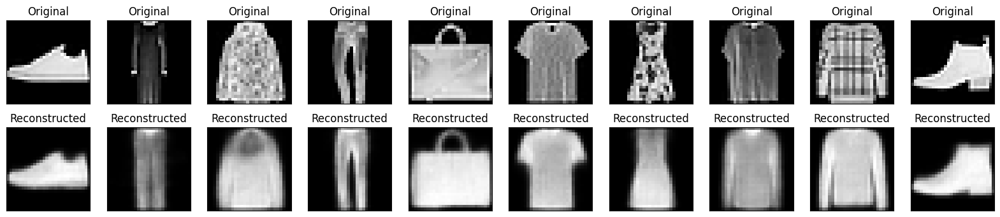

469/469 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - kl_loss: 0.5414 - loss: 0.8557 - reconstruction_loss: 0.3143 - val_kl_loss: 0.5414 - val_loss: 0.8367 - val_reconstruction_loss: 0.2953
Epoch 42/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


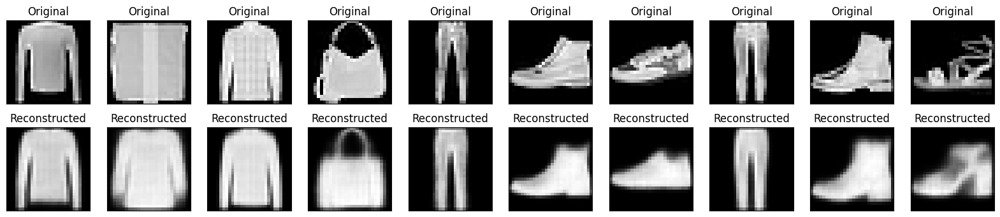

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5414 - loss: 0.8556 - reconstruction_loss: 0.3143 - val_kl_loss: 0.5414 - val_loss: 0.8416 - val_reconstruction_loss: 0.3002
Epoch 43/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


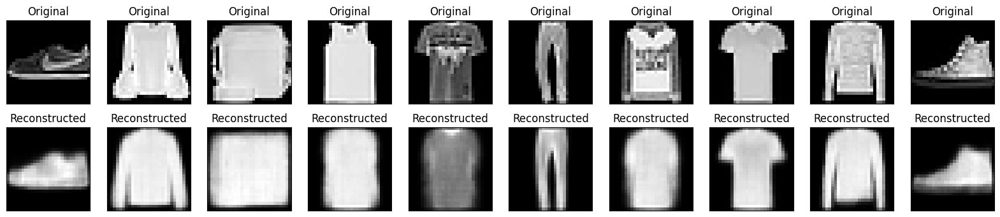

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5413 - loss: 0.8553 - reconstruction_loss: 0.3141 - val_kl_loss: 0.5411 - val_loss: 0.8400 - val_reconstruction_loss: 0.2988
Epoch 44/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


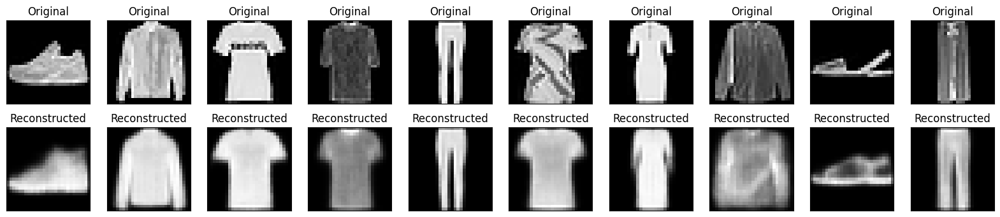

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - kl_loss: 0.5413 - loss: 0.8555 - reconstruction_loss: 0.3141 - val_kl_loss: 0.5416 - val_loss: 0.8373 - val_reconstruction_loss: 0.2957
Epoch 45/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


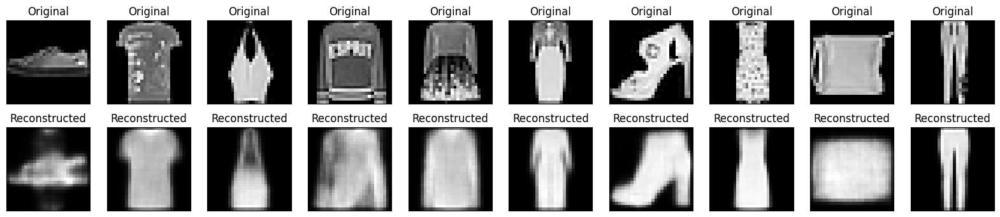

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5415 - loss: 0.8554 - reconstruction_loss: 0.3139 - val_kl_loss: 0.5420 - val_loss: 0.8344 - val_reconstruction_loss: 0.2924
Epoch 46/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


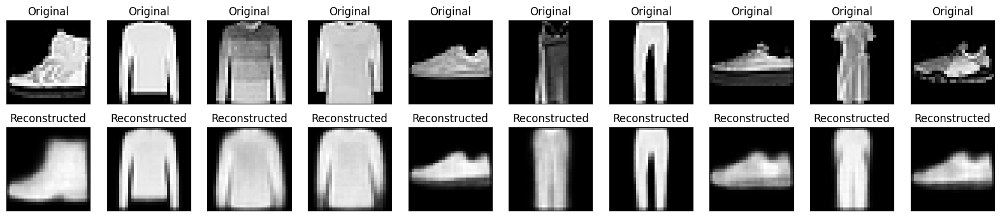

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5415 - loss: 0.8553 - reconstruction_loss: 0.3138 - val_kl_loss: 0.5411 - val_loss: 0.8392 - val_reconstruction_loss: 0.2981
Epoch 47/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


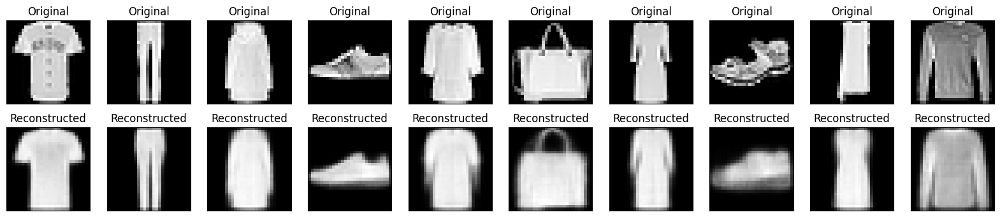

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5415 - loss: 0.8554 - reconstruction_loss: 0.3139 - val_kl_loss: 0.5415 - val_loss: 0.8391 - val_reconstruction_loss: 0.2975
Epoch 48/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


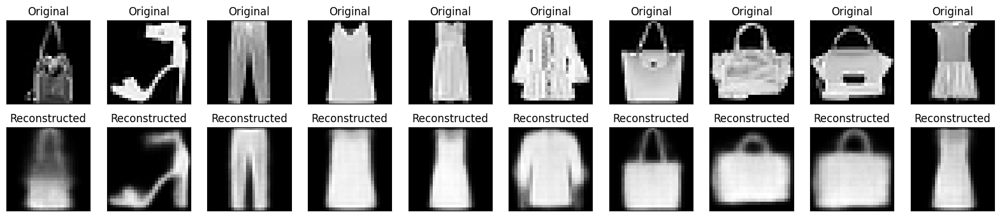

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5417 - loss: 0.8553 - reconstruction_loss: 0.3137 - val_kl_loss: 0.5414 - val_loss: 0.8449 - val_reconstruction_loss: 0.3034
Epoch 49/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


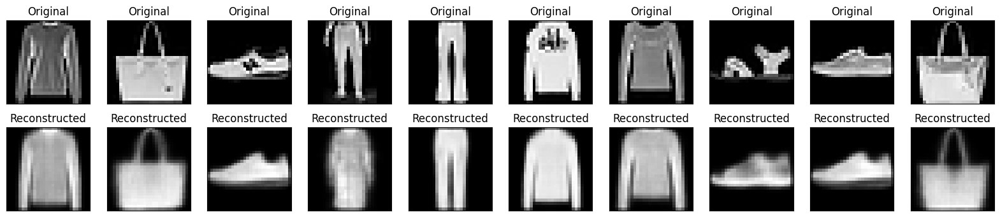

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5416 - loss: 0.8552 - reconstruction_loss: 0.3136 - val_kl_loss: 0.5412 - val_loss: 0.8412 - val_reconstruction_loss: 0.3000
Epoch 50/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


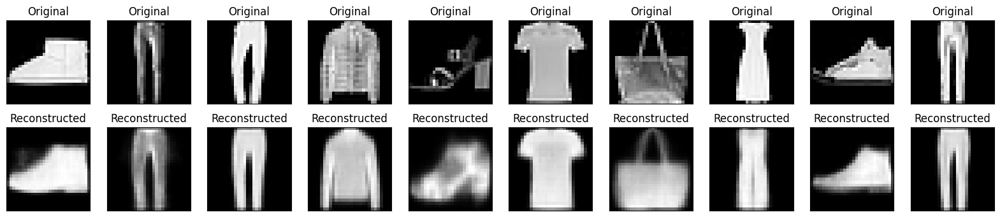

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5416 - loss: 0.8551 - reconstruction_loss: 0.3136 - val_kl_loss: 0.5420 - val_loss: 0.8363 - val_reconstruction_loss: 0.2943
Epoch 51/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


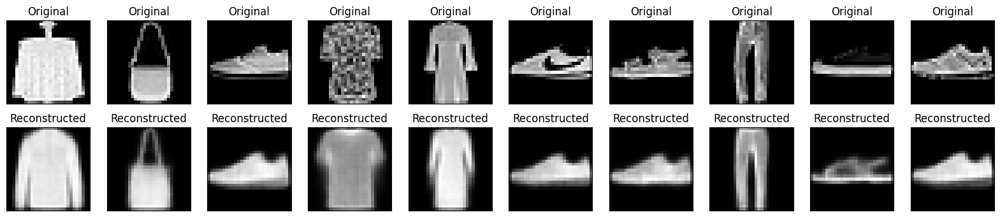

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5416 - loss: 0.8551 - reconstruction_loss: 0.3135 - val_kl_loss: 0.5422 - val_loss: 0.8376 - val_reconstruction_loss: 0.2954
Epoch 52/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


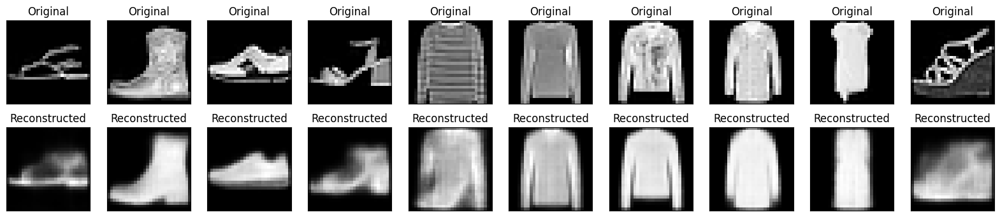

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - kl_loss: 0.5416 - loss: 0.8551 - reconstruction_loss: 0.3134 - val_kl_loss: 0.5419 - val_loss: 0.8361 - val_reconstruction_loss: 0.2942
Epoch 53/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


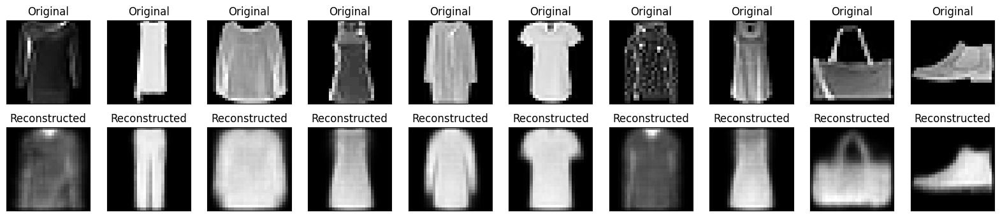

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - kl_loss: 0.5416 - loss: 0.8550 - reconstruction_loss: 0.3134 - val_kl_loss: 0.5423 - val_loss: 0.8369 - val_reconstruction_loss: 0.2946
Epoch 54/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


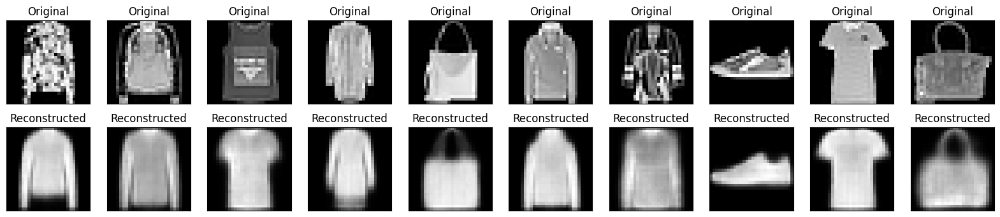

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - kl_loss: 0.5417 - loss: 0.8549 - reconstruction_loss: 0.3132 - val_kl_loss: 0.5417 - val_loss: 0.8369 - val_reconstruction_loss: 0.2952
Epoch 55/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


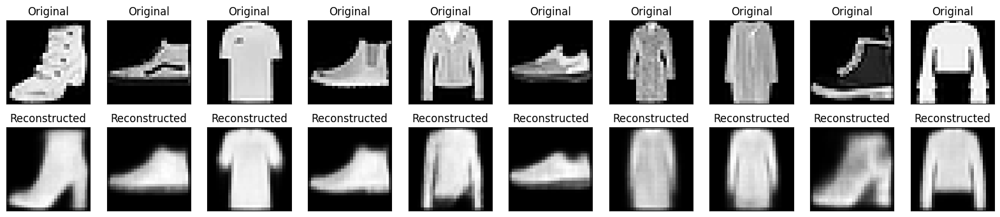

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5418 - loss: 0.8549 - reconstruction_loss: 0.3132 - val_kl_loss: 0.5412 - val_loss: 0.8338 - val_reconstruction_loss: 0.2926
Epoch 56/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


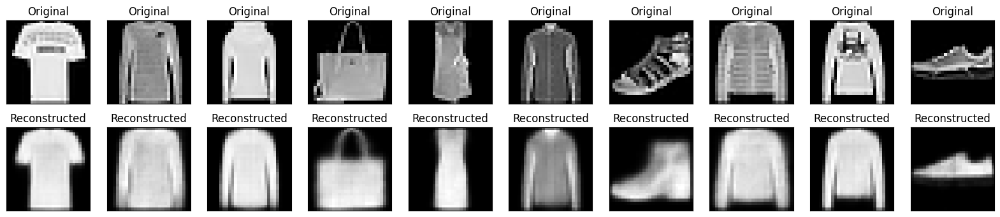

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 57ms/step - kl_loss: 0.5418 - loss: 0.8549 - reconstruction_loss: 0.3131 - val_kl_loss: 0.5409 - val_loss: 0.8437 - val_reconstruction_loss: 0.3029
Epoch 57/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


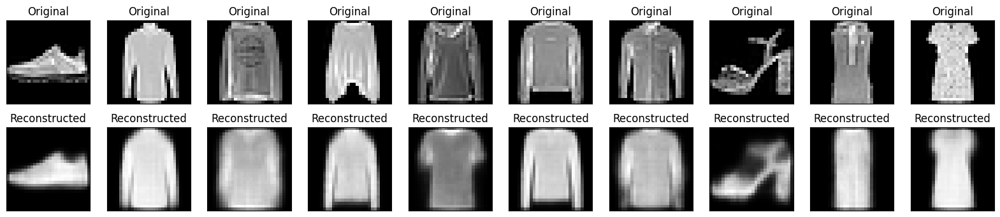

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 57ms/step - kl_loss: 0.5418 - loss: 0.8548 - reconstruction_loss: 0.3130 - val_kl_loss: 0.5411 - val_loss: 0.8329 - val_reconstruction_loss: 0.2918
Epoch 58/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


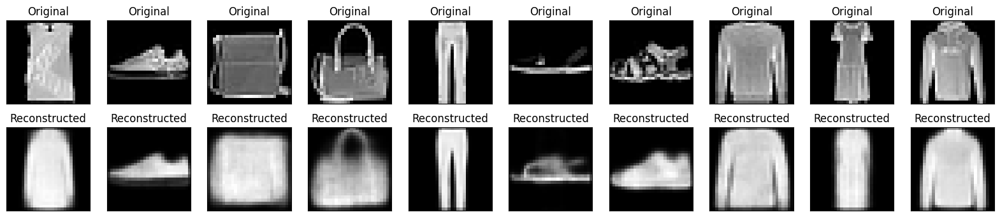

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5418 - loss: 0.8549 - reconstruction_loss: 0.3130 - val_kl_loss: 0.5430 - val_loss: 0.8430 - val_reconstruction_loss: 0.3000
Epoch 59/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


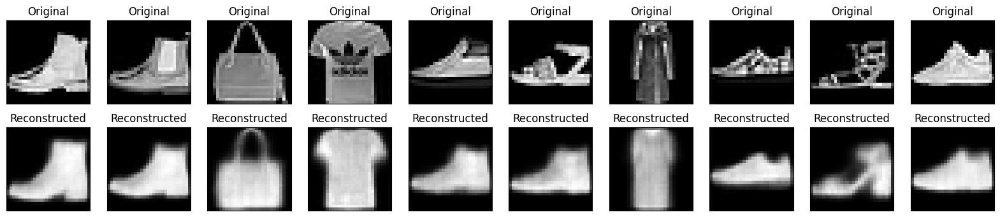

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step - kl_loss: 0.5419 - loss: 0.8547 - reconstruction_loss: 0.3128 - val_kl_loss: 0.5430 - val_loss: 0.8397 - val_reconstruction_loss: 0.2968
Epoch 60/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


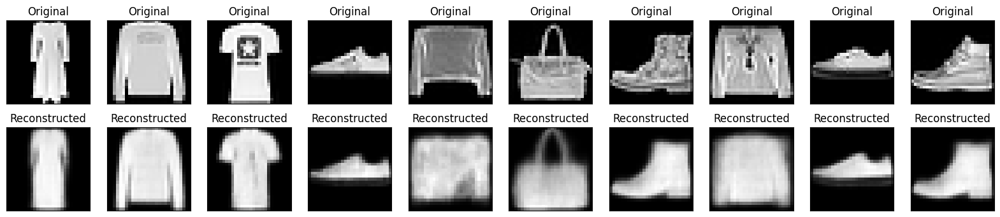

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5418 - loss: 0.8547 - reconstruction_loss: 0.3129 - val_kl_loss: 0.5412 - val_loss: 0.8410 - val_reconstruction_loss: 0.2997
Epoch 61/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


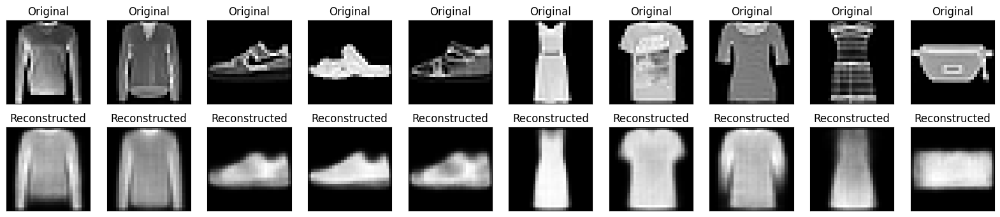

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - kl_loss: 0.5418 - loss: 0.8547 - reconstruction_loss: 0.3129 - val_kl_loss: 0.5434 - val_loss: 0.8407 - val_reconstruction_loss: 0.2974
Epoch 62/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


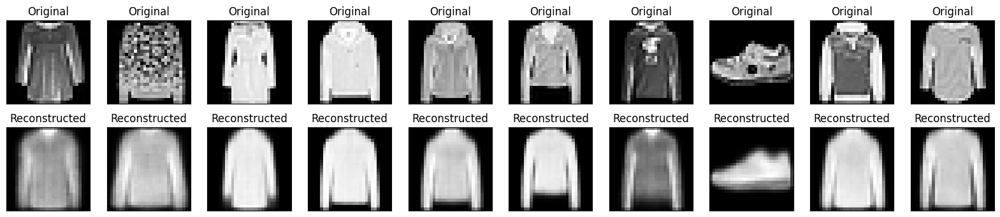

469/469 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - kl_loss: 0.5419 - loss: 0.8546 - reconstruction_loss: 0.3127 - val_kl_loss: 0.5427 - val_loss: 0.8346 - val_reconstruction_loss: 0.2920
Epoch 63/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


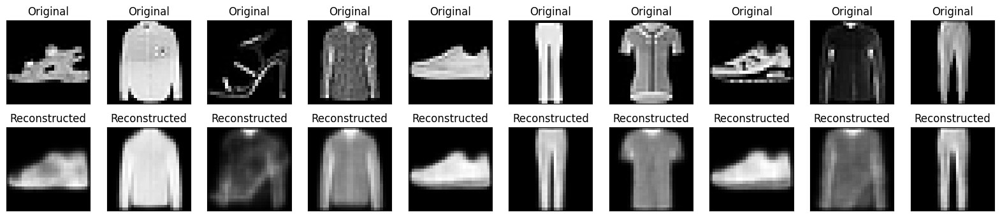

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - kl_loss: 0.5420 - loss: 0.8546 - reconstruction_loss: 0.3126 - val_kl_loss: 0.5421 - val_loss: 0.8371 - val_reconstruction_loss: 0.2950
Epoch 64/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


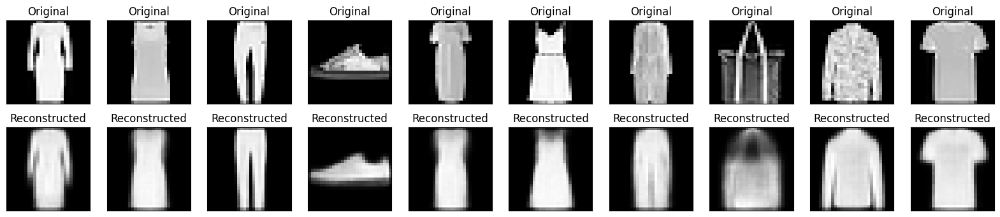

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5420 - loss: 0.8546 - reconstruction_loss: 0.3126 - val_kl_loss: 0.5409 - val_loss: 0.8342 - val_reconstruction_loss: 0.2933
Epoch 65/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


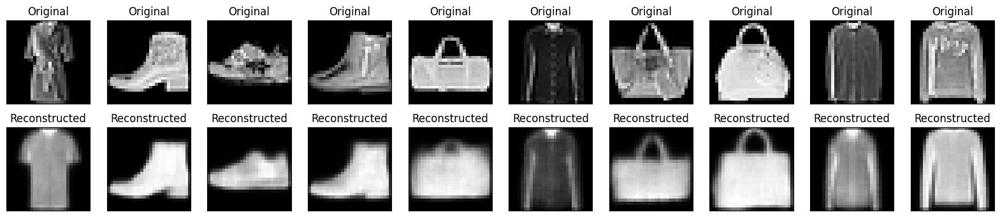

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5420 - loss: 0.8547 - reconstruction_loss: 0.3126 - val_kl_loss: 0.5435 - val_loss: 0.8363 - val_reconstruction_loss: 0.2928
Epoch 66/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


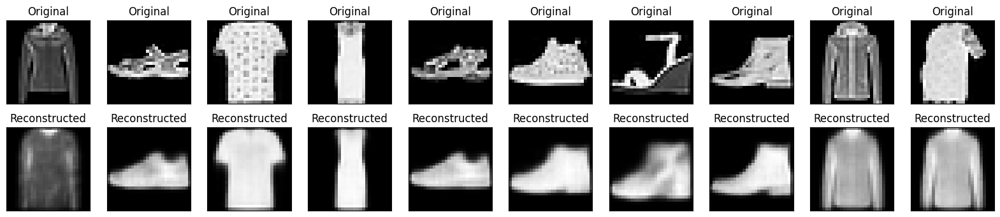

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5419 - loss: 0.8545 - reconstruction_loss: 0.3126 - val_kl_loss: 0.5428 - val_loss: 0.8399 - val_reconstruction_loss: 0.2971
Epoch 67/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


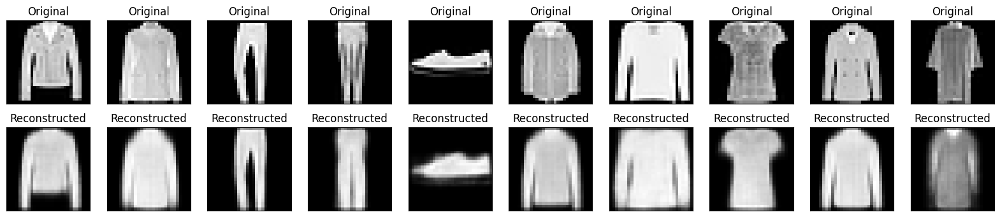

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5421 - loss: 0.8545 - reconstruction_loss: 0.3125 - val_kl_loss: 0.5419 - val_loss: 0.8399 - val_reconstruction_loss: 0.2980
Epoch 68/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


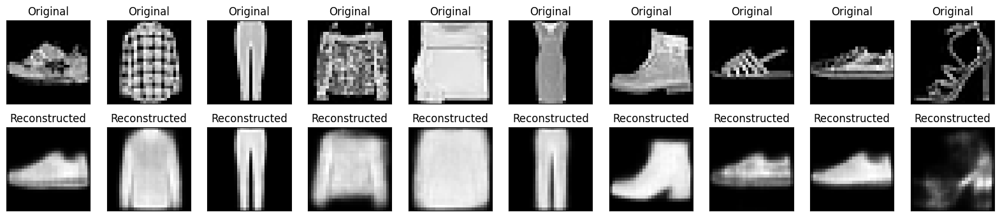

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - kl_loss: 0.5421 - loss: 0.8544 - reconstruction_loss: 0.3123 - val_kl_loss: 0.5404 - val_loss: 0.8353 - val_reconstruction_loss: 0.2949
Epoch 69/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


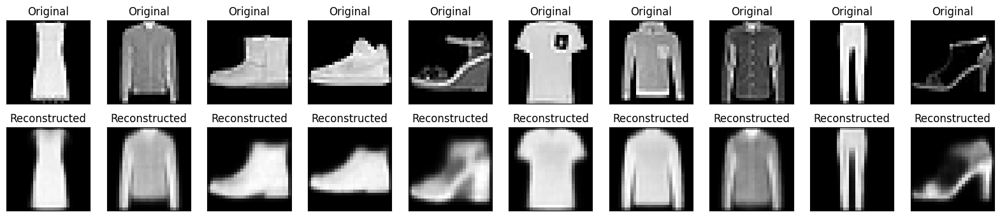

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5420 - loss: 0.8544 - reconstruction_loss: 0.3123 - val_kl_loss: 0.5422 - val_loss: 0.8429 - val_reconstruction_loss: 0.3007
Epoch 70/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


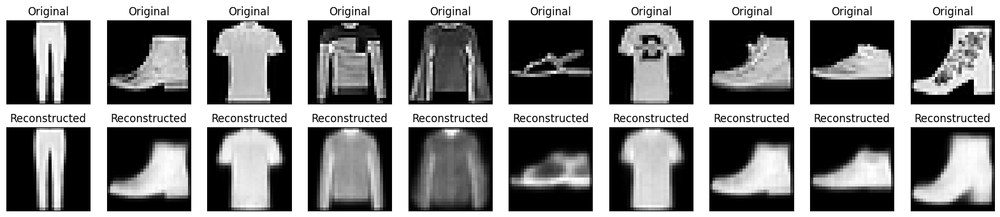

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5420 - loss: 0.8543 - reconstruction_loss: 0.3124 - val_kl_loss: 0.5420 - val_loss: 0.8334 - val_reconstruction_loss: 0.2914
Epoch 71/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


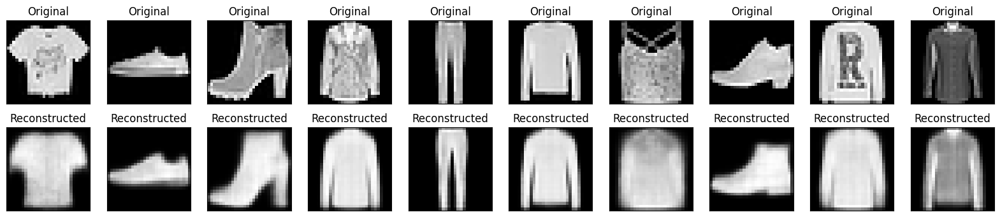

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 57ms/step - kl_loss: 0.5420 - loss: 0.8543 - reconstruction_loss: 0.3123 - val_kl_loss: 0.5414 - val_loss: 0.8429 - val_reconstruction_loss: 0.3015
Epoch 72/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


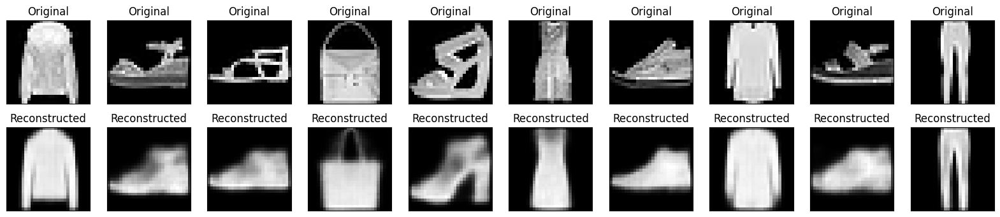

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - kl_loss: 0.5421 - loss: 0.8543 - reconstruction_loss: 0.3122 - val_kl_loss: 0.5416 - val_loss: 0.8378 - val_reconstruction_loss: 0.2962
Epoch 73/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


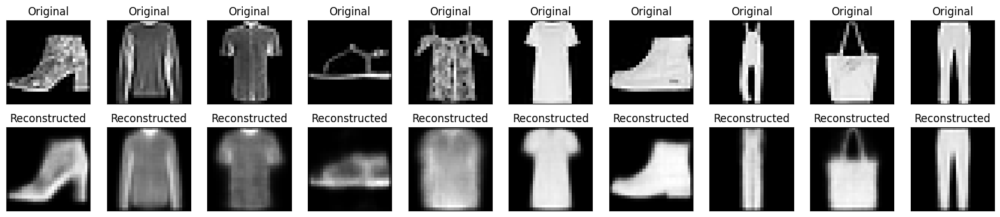

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5420 - loss: 0.8543 - reconstruction_loss: 0.3123 - val_kl_loss: 0.5435 - val_loss: 0.8376 - val_reconstruction_loss: 0.2941
Epoch 74/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


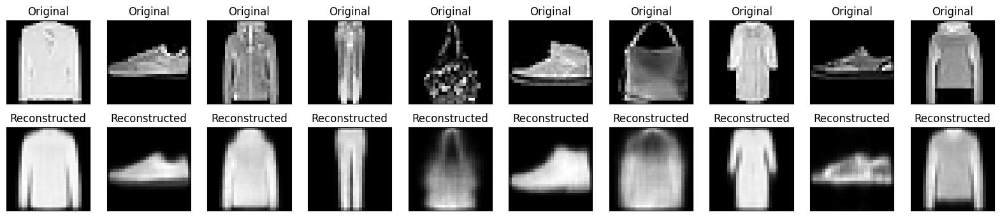

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5421 - loss: 0.8542 - reconstruction_loss: 0.3122 - val_kl_loss: 0.5437 - val_loss: 0.8410 - val_reconstruction_loss: 0.2973
Epoch 75/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


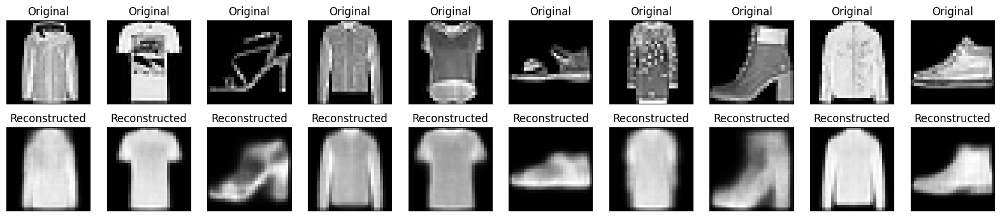

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5421 - loss: 0.8543 - reconstruction_loss: 0.3122 - val_kl_loss: 0.5421 - val_loss: 0.8379 - val_reconstruction_loss: 0.2958
Epoch 76/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


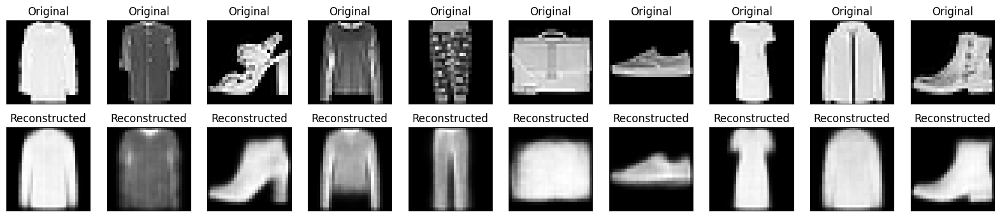

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5421 - loss: 0.8541 - reconstruction_loss: 0.3120 - val_kl_loss: 0.5419 - val_loss: 0.8380 - val_reconstruction_loss: 0.2961
Epoch 77/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


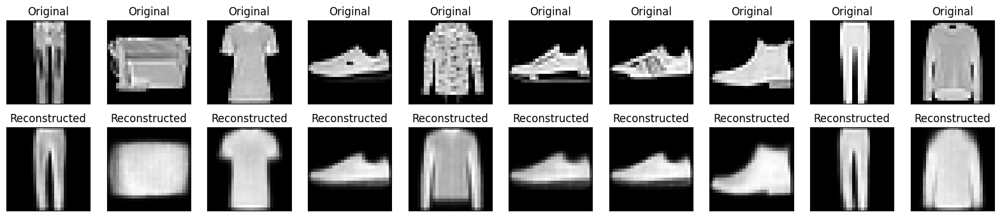

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5421 - loss: 0.8541 - reconstruction_loss: 0.3120 - val_kl_loss: 0.5427 - val_loss: 0.8422 - val_reconstruction_loss: 0.2995
Epoch 78/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


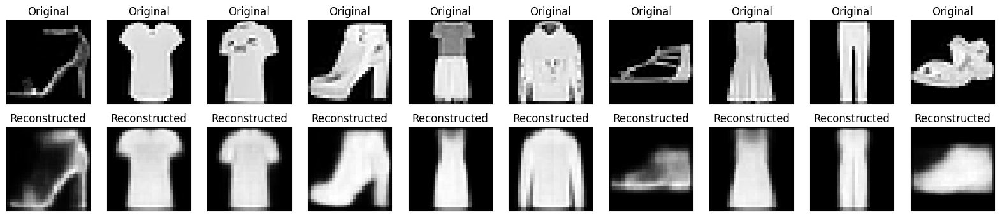

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5421 - loss: 0.8540 - reconstruction_loss: 0.3119 - val_kl_loss: 0.5426 - val_loss: 0.8353 - val_reconstruction_loss: 0.2927
Epoch 79/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


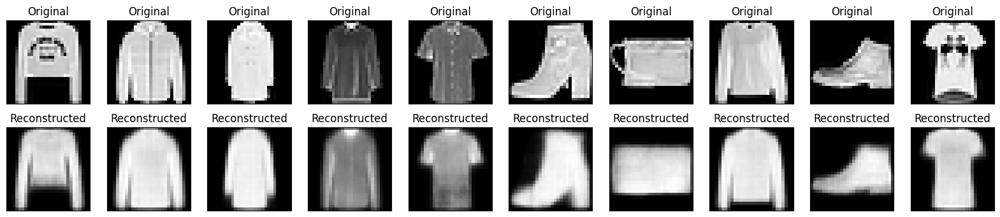

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5422 - loss: 0.8542 - reconstruction_loss: 0.3120 - val_kl_loss: 0.5409 - val_loss: 0.8382 - val_reconstruction_loss: 0.2973
Epoch 80/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


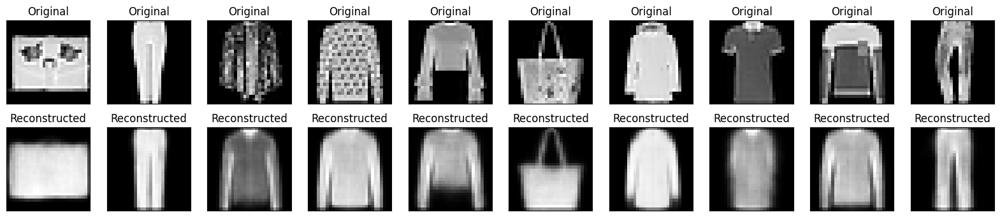

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5420 - loss: 0.8540 - reconstruction_loss: 0.3120 - val_kl_loss: 0.5422 - val_loss: 0.8374 - val_reconstruction_loss: 0.2952
Epoch 81/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


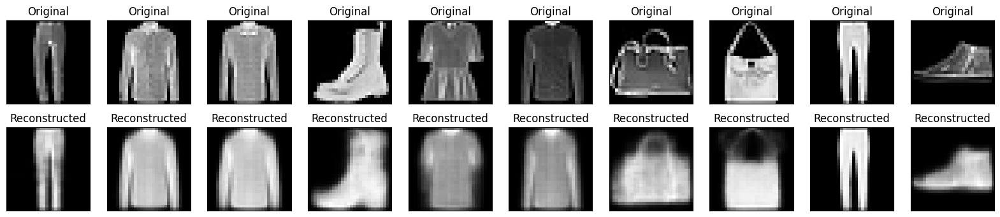

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5422 - loss: 0.8541 - reconstruction_loss: 0.3119 - val_kl_loss: 0.5431 - val_loss: 0.8373 - val_reconstruction_loss: 0.2942
Epoch 82/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


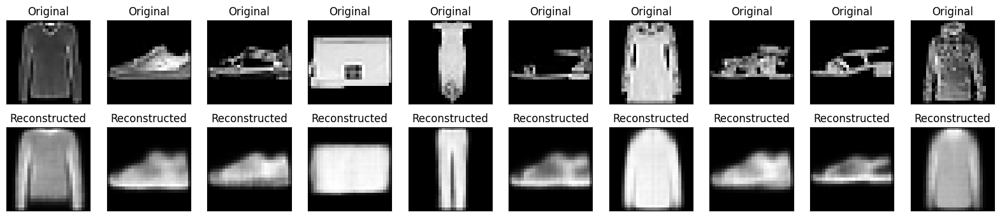

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5422 - loss: 0.8541 - reconstruction_loss: 0.3119 - val_kl_loss: 0.5429 - val_loss: 0.8378 - val_reconstruction_loss: 0.2949
Epoch 83/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


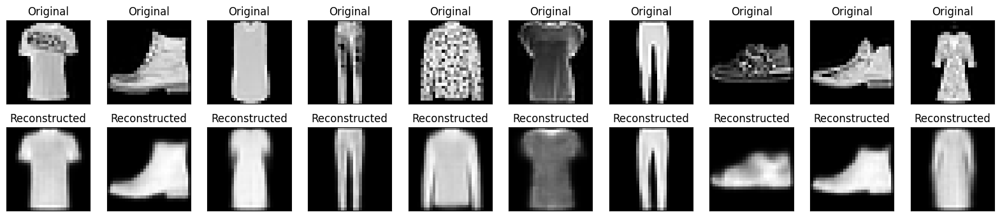

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5422 - loss: 0.8540 - reconstruction_loss: 0.3118 - val_kl_loss: 0.5419 - val_loss: 0.8391 - val_reconstruction_loss: 0.2972
Epoch 84/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


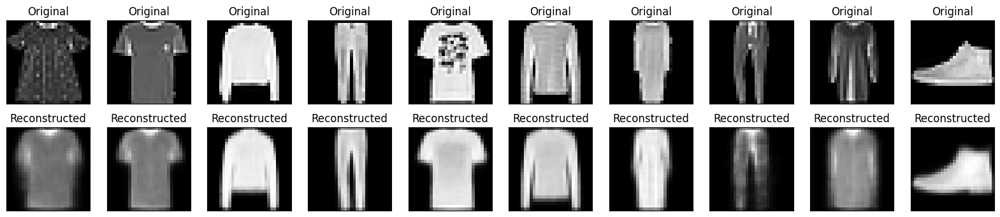

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5423 - loss: 0.8540 - reconstruction_loss: 0.3116 - val_kl_loss: 0.5420 - val_loss: 0.8347 - val_reconstruction_loss: 0.2928
Epoch 85/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


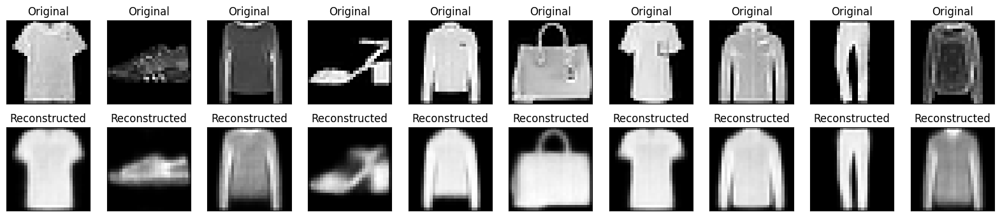

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - kl_loss: 0.5421 - loss: 0.8540 - reconstruction_loss: 0.3118 - val_kl_loss: 0.5429 - val_loss: 0.8397 - val_reconstruction_loss: 0.2968
Epoch 86/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


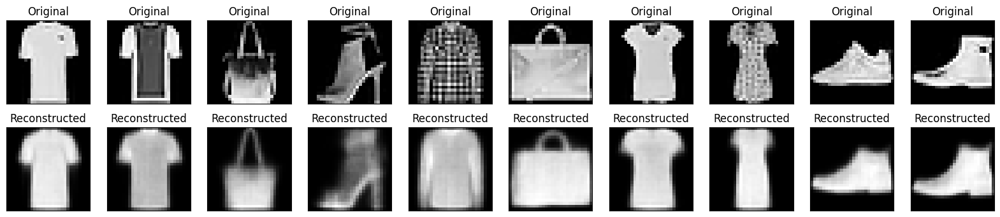

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5422 - loss: 0.8540 - reconstruction_loss: 0.3118 - val_kl_loss: 0.5421 - val_loss: 0.8362 - val_reconstruction_loss: 0.2941
Epoch 87/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


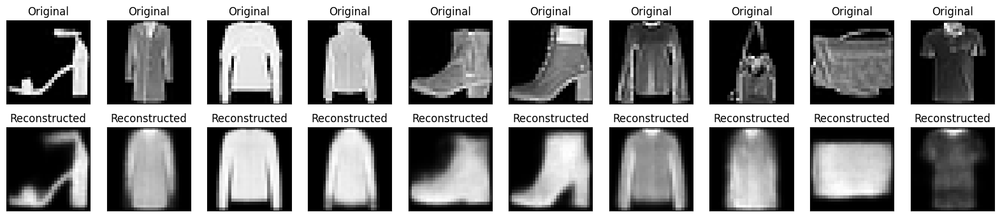

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5423 - loss: 0.8539 - reconstruction_loss: 0.3116 - val_kl_loss: 0.5427 - val_loss: 0.8327 - val_reconstruction_loss: 0.2900
Epoch 88/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


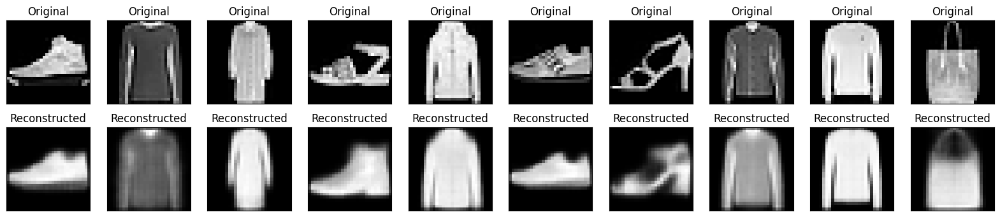

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5423 - loss: 0.8539 - reconstruction_loss: 0.3116 - val_kl_loss: 0.5426 - val_loss: 0.8382 - val_reconstruction_loss: 0.2956
Epoch 89/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


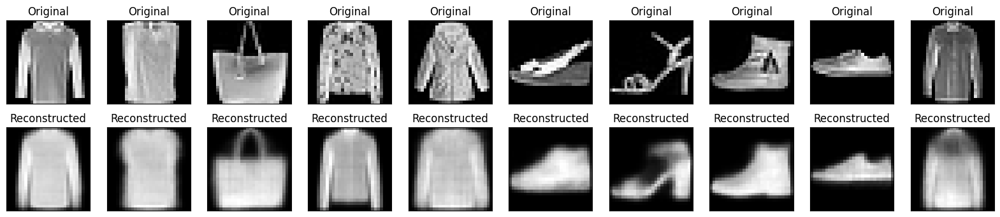

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5423 - loss: 0.8539 - reconstruction_loss: 0.3116 - val_kl_loss: 0.5423 - val_loss: 0.8408 - val_reconstruction_loss: 0.2985
Epoch 90/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


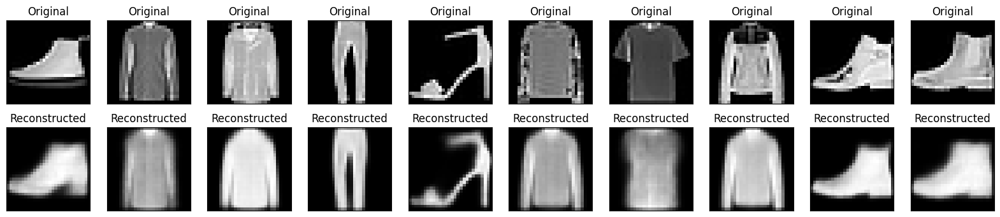

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5422 - loss: 0.8539 - reconstruction_loss: 0.3116 - val_kl_loss: 0.5420 - val_loss: 0.8411 - val_reconstruction_loss: 0.2990
Epoch 91/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


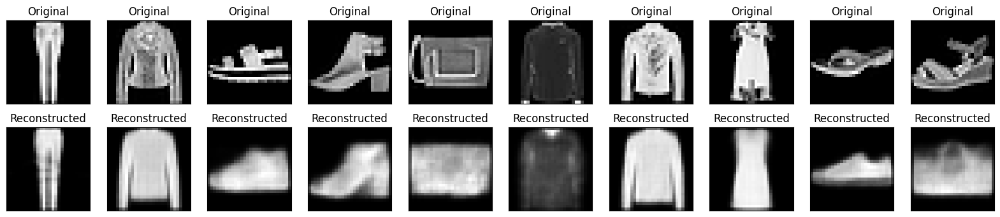

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5422 - loss: 0.8537 - reconstruction_loss: 0.3115 - val_kl_loss: 0.5424 - val_loss: 0.8418 - val_reconstruction_loss: 0.2994
Epoch 92/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


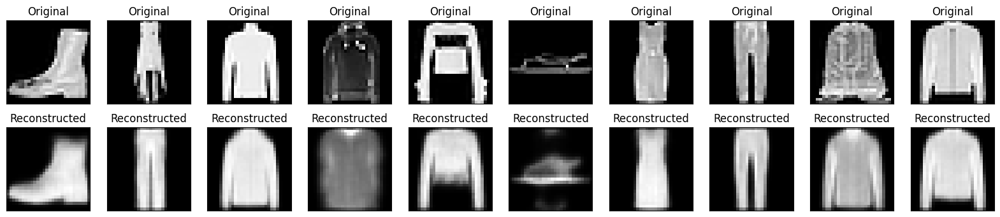

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5423 - loss: 0.8538 - reconstruction_loss: 0.3115 - val_kl_loss: 0.5419 - val_loss: 0.8396 - val_reconstruction_loss: 0.2977
Epoch 93/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


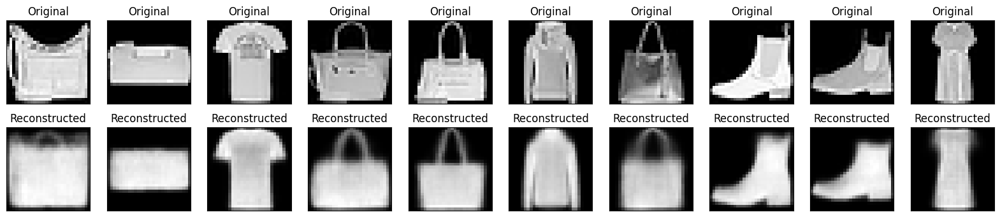

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5423 - loss: 0.8537 - reconstruction_loss: 0.3115 - val_kl_loss: 0.5414 - val_loss: 0.8331 - val_reconstruction_loss: 0.2916
Epoch 94/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


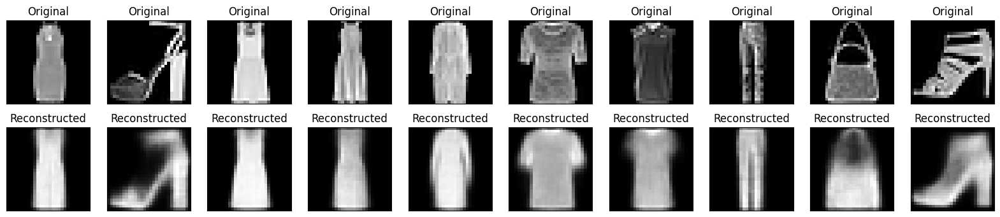

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5423 - loss: 0.8537 - reconstruction_loss: 0.3114 - val_kl_loss: 0.5427 - val_loss: 0.8338 - val_reconstruction_loss: 0.2911
Epoch 95/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


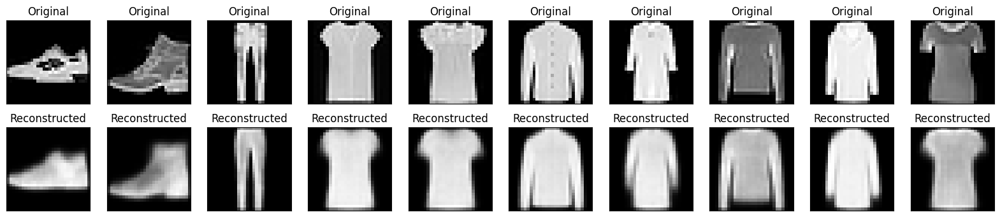

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5423 - loss: 0.8537 - reconstruction_loss: 0.3114 - val_kl_loss: 0.5448 - val_loss: 0.8404 - val_reconstruction_loss: 0.2956
Epoch 96/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


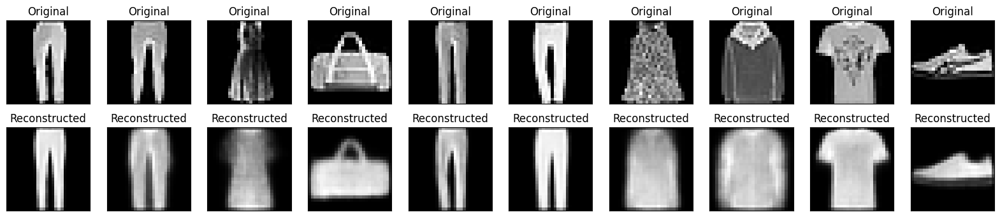

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5424 - loss: 0.8537 - reconstruction_loss: 0.3113 - val_kl_loss: 0.5430 - val_loss: 0.8382 - val_reconstruction_loss: 0.2951
Epoch 97/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


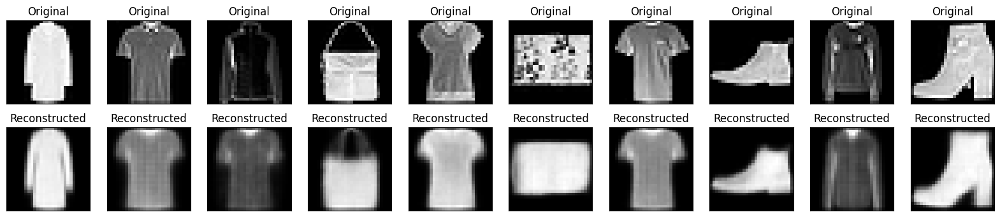

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - kl_loss: 0.5424 - loss: 0.8537 - reconstruction_loss: 0.3113 - val_kl_loss: 0.5422 - val_loss: 0.8307 - val_reconstruction_loss: 0.2885
Epoch 98/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


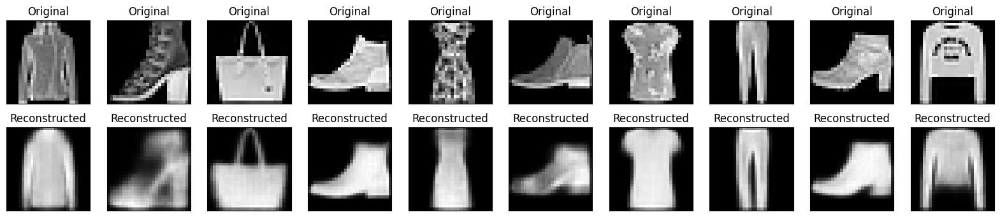

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5425 - loss: 0.8538 - reconstruction_loss: 0.3114 - val_kl_loss: 0.5439 - val_loss: 0.8379 - val_reconstruction_loss: 0.2940
Epoch 99/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


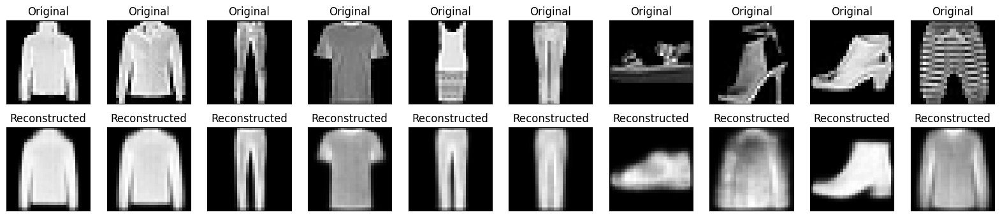

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5424 - loss: 0.8536 - reconstruction_loss: 0.3113 - val_kl_loss: 0.5415 - val_loss: 0.8402 - val_reconstruction_loss: 0.2987
Epoch 100/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


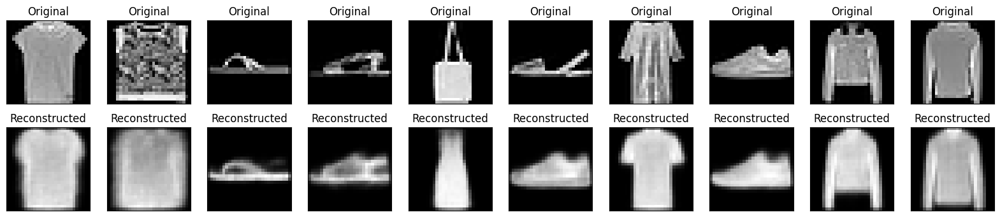

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5424 - loss: 0.8536 - reconstruction_loss: 0.3112 - val_kl_loss: 0.5437 - val_loss: 0.8374 - val_reconstruction_loss: 0.2937
Epoch 101/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


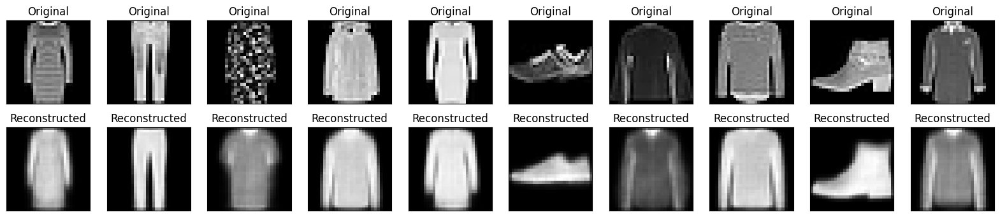

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5425 - loss: 0.8536 - reconstruction_loss: 0.3111 - val_kl_loss: 0.5436 - val_loss: 0.8347 - val_reconstruction_loss: 0.2911
Epoch 102/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


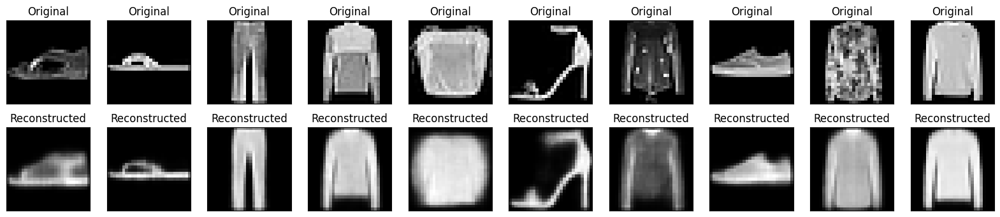

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5424 - loss: 0.8535 - reconstruction_loss: 0.3111 - val_kl_loss: 0.5422 - val_loss: 0.8369 - val_reconstruction_loss: 0.2947
Epoch 103/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


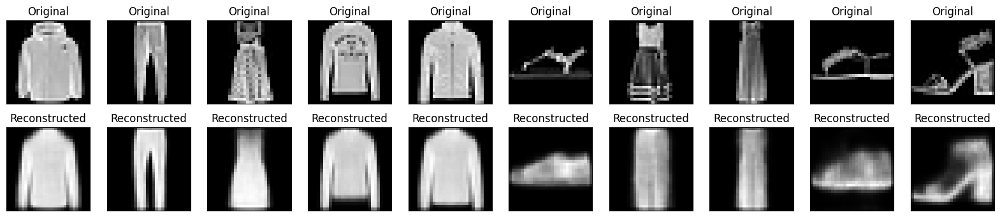

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step - kl_loss: 0.5425 - loss: 0.8536 - reconstruction_loss: 0.3112 - val_kl_loss: 0.5439 - val_loss: 0.8381 - val_reconstruction_loss: 0.2942
Epoch 104/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


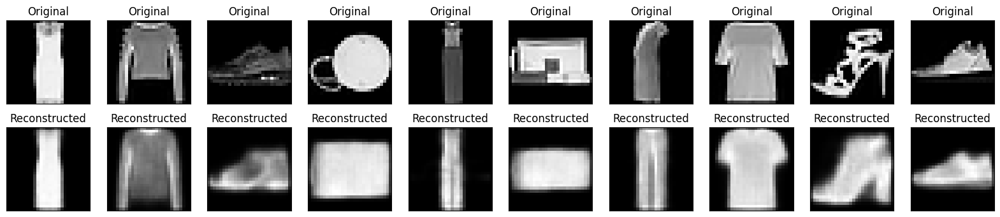

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5424 - loss: 0.8535 - reconstruction_loss: 0.3111 - val_kl_loss: 0.5417 - val_loss: 0.8398 - val_reconstruction_loss: 0.2981
Epoch 105/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


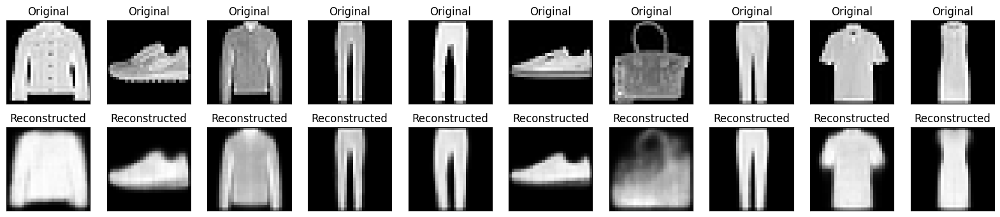

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5425 - loss: 0.8535 - reconstruction_loss: 0.3110 - val_kl_loss: 0.5412 - val_loss: 0.8387 - val_reconstruction_loss: 0.2975
Epoch 106/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


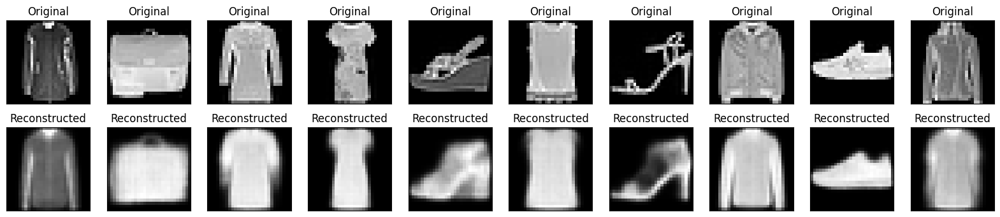

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5425 - loss: 0.8536 - reconstruction_loss: 0.3111 - val_kl_loss: 0.5425 - val_loss: 0.8379 - val_reconstruction_loss: 0.2954
Epoch 107/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


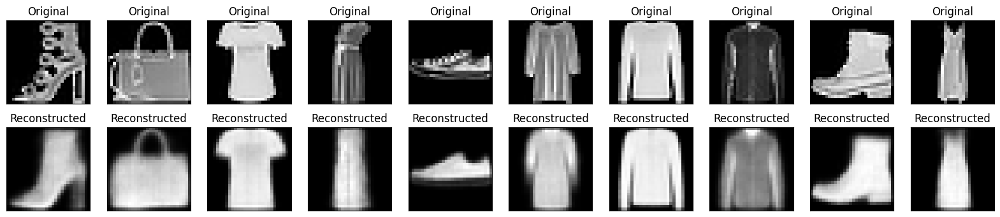

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5424 - loss: 0.8534 - reconstruction_loss: 0.3110 - val_kl_loss: 0.5431 - val_loss: 0.8379 - val_reconstruction_loss: 0.2949
Epoch 108/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


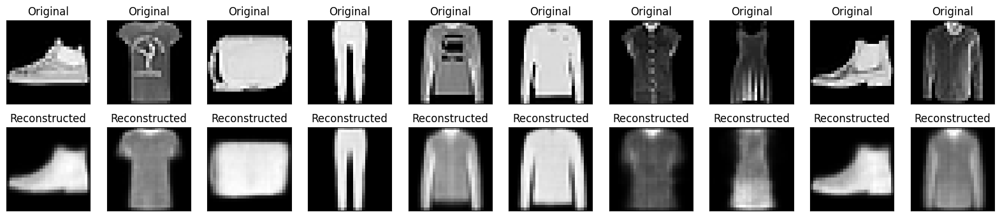

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5425 - loss: 0.8534 - reconstruction_loss: 0.3109 - val_kl_loss: 0.5417 - val_loss: 0.8404 - val_reconstruction_loss: 0.2987
Epoch 109/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


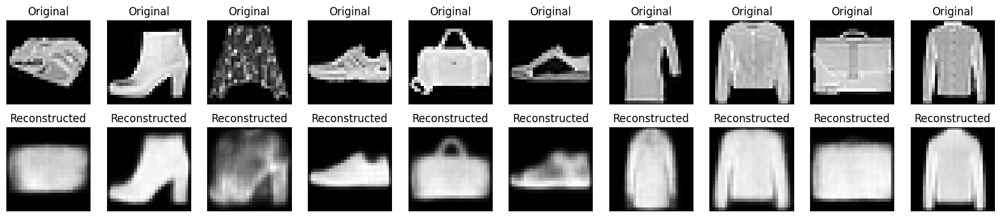

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5425 - loss: 0.8535 - reconstruction_loss: 0.3110 - val_kl_loss: 0.5430 - val_loss: 0.8408 - val_reconstruction_loss: 0.2977
Epoch 110/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


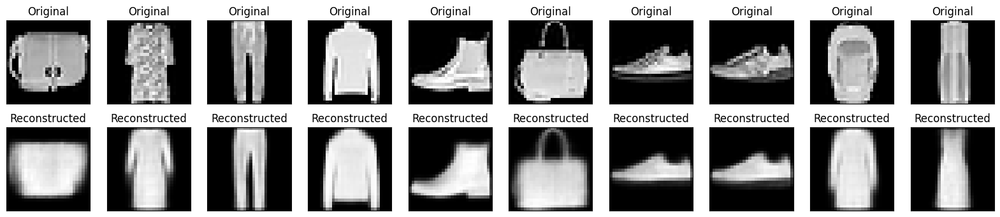

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5425 - loss: 0.8535 - reconstruction_loss: 0.3110 - val_kl_loss: 0.5430 - val_loss: 0.8353 - val_reconstruction_loss: 0.2923
Epoch 111/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


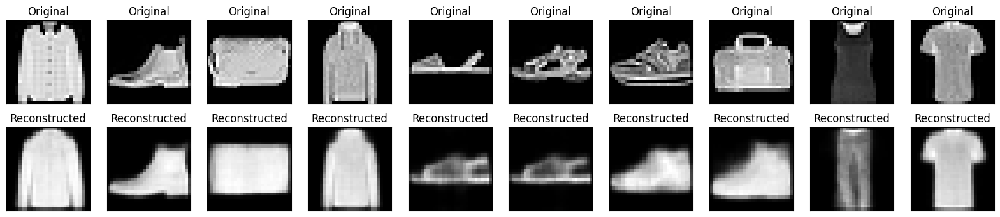

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5425 - loss: 0.8534 - reconstruction_loss: 0.3109 - val_kl_loss: 0.5419 - val_loss: 0.8336 - val_reconstruction_loss: 0.2917
Epoch 112/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


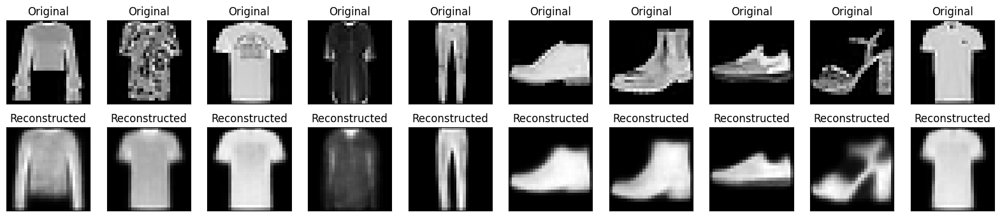

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5426 - loss: 0.8534 - reconstruction_loss: 0.3108 - val_kl_loss: 0.5428 - val_loss: 0.8381 - val_reconstruction_loss: 0.2954
Epoch 113/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


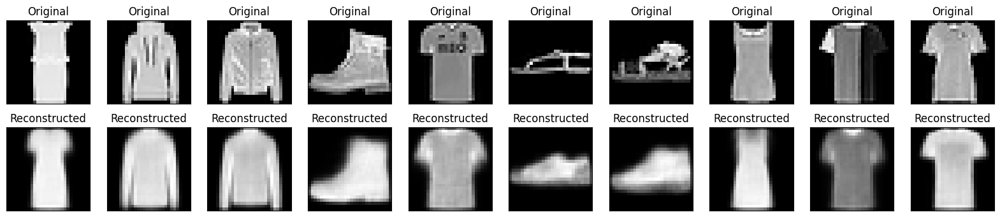

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5425 - loss: 0.8533 - reconstruction_loss: 0.3109 - val_kl_loss: 0.5427 - val_loss: 0.8413 - val_reconstruction_loss: 0.2986
Epoch 114/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


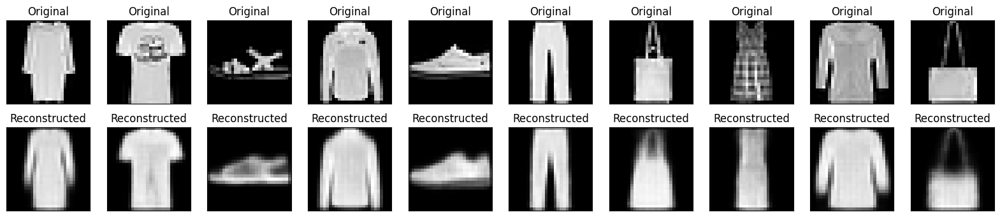

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5426 - loss: 0.8534 - reconstruction_loss: 0.3108 - val_kl_loss: 0.5430 - val_loss: 0.8411 - val_reconstruction_loss: 0.2982
Epoch 115/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


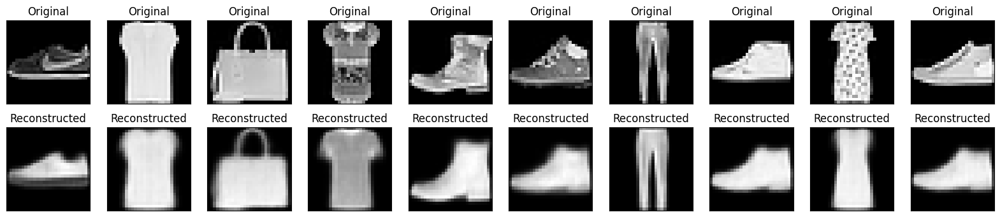

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5426 - loss: 0.8533 - reconstruction_loss: 0.3108 - val_kl_loss: 0.5416 - val_loss: 0.8458 - val_reconstruction_loss: 0.3042
Epoch 116/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


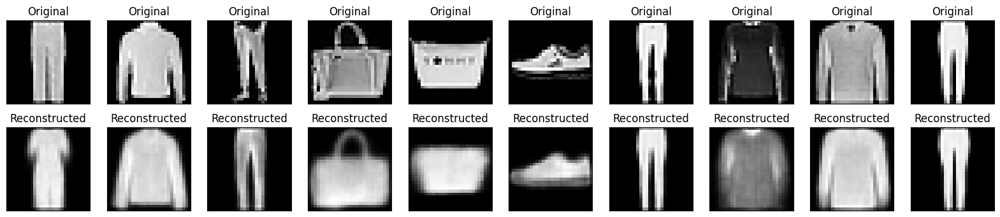

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5426 - loss: 0.8533 - reconstruction_loss: 0.3107 - val_kl_loss: 0.5426 - val_loss: 0.8348 - val_reconstruction_loss: 0.2923
Epoch 117/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


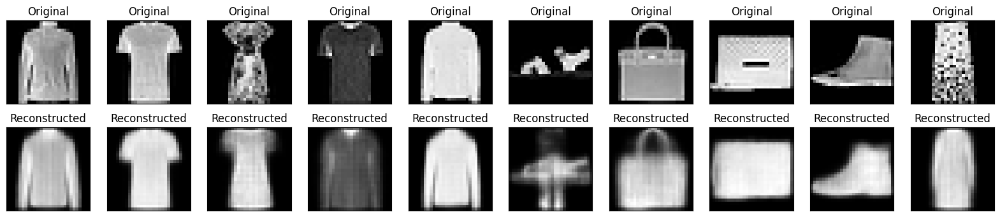

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5425 - loss: 0.8532 - reconstruction_loss: 0.3107 - val_kl_loss: 0.5424 - val_loss: 0.8462 - val_reconstruction_loss: 0.3039
Epoch 118/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


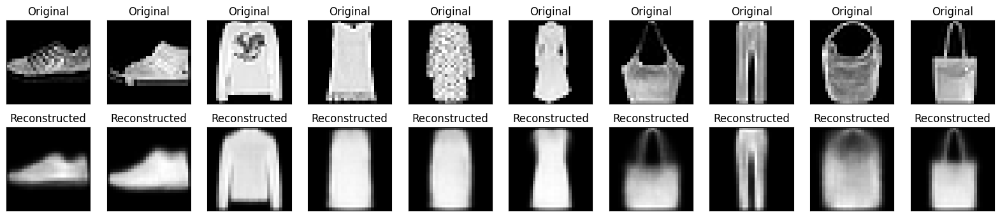

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5426 - loss: 0.8533 - reconstruction_loss: 0.3107 - val_kl_loss: 0.5420 - val_loss: 0.8335 - val_reconstruction_loss: 0.2915
Epoch 119/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


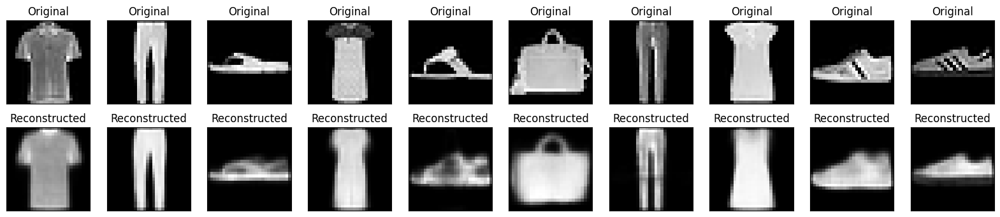

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - kl_loss: 0.5426 - loss: 0.8533 - reconstruction_loss: 0.3107 - val_kl_loss: 0.5429 - val_loss: 0.8373 - val_reconstruction_loss: 0.2944
Epoch 120/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


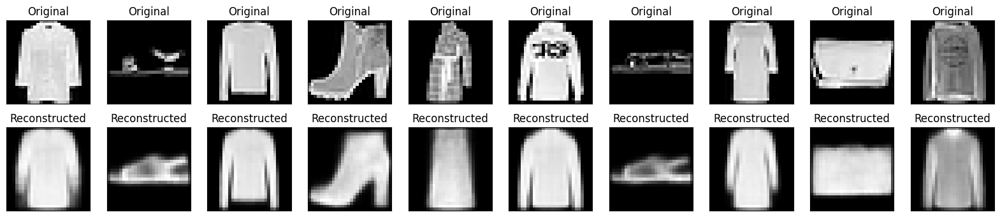

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step - kl_loss: 0.5426 - loss: 0.8534 - reconstruction_loss: 0.3107 - val_kl_loss: 0.5422 - val_loss: 0.8364 - val_reconstruction_loss: 0.2942
Epoch 121/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


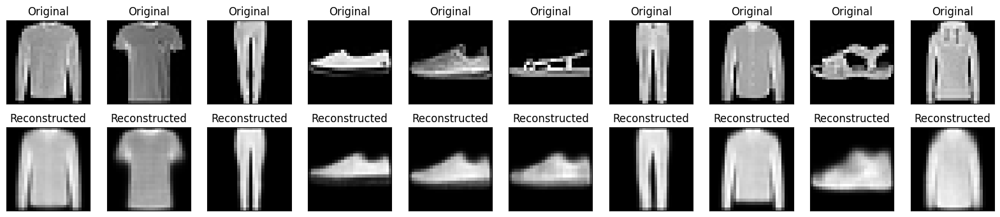

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - kl_loss: 0.5426 - loss: 0.8532 - reconstruction_loss: 0.3106 - val_kl_loss: 0.5423 - val_loss: 0.8395 - val_reconstruction_loss: 0.2973
Epoch 122/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


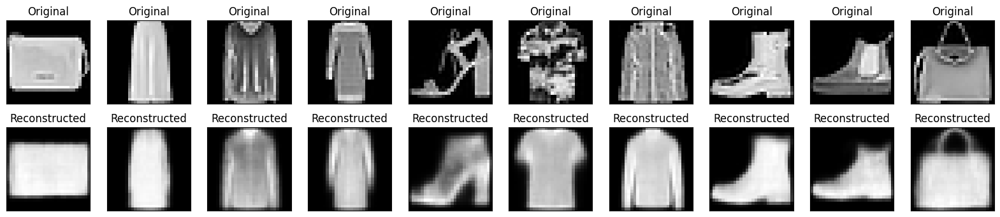

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5426 - loss: 0.8532 - reconstruction_loss: 0.3106 - val_kl_loss: 0.5427 - val_loss: 0.8382 - val_reconstruction_loss: 0.2956
Epoch 123/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


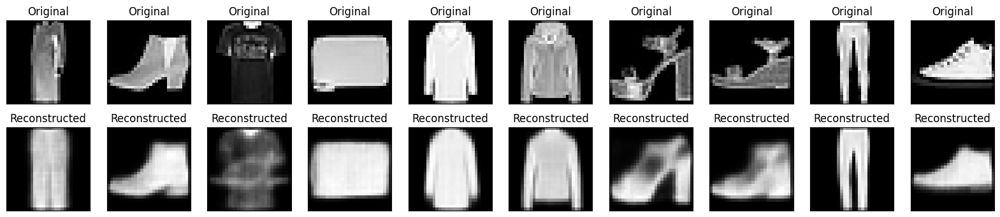

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - kl_loss: 0.5426 - loss: 0.8531 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5411 - val_loss: 0.8394 - val_reconstruction_loss: 0.2983
Epoch 124/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


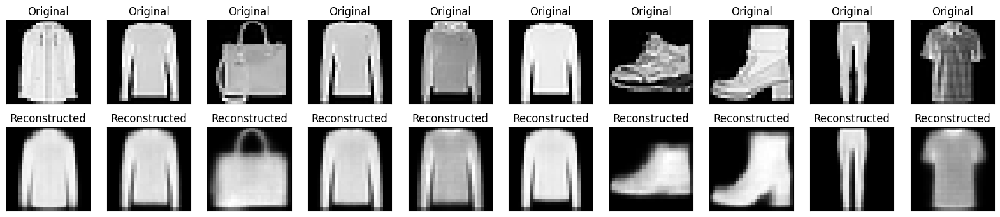

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5427 - loss: 0.8532 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5444 - val_loss: 0.8375 - val_reconstruction_loss: 0.2931
Epoch 125/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


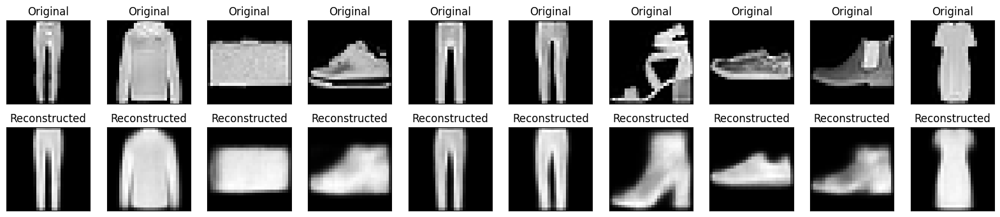

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5427 - loss: 0.8531 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5432 - val_loss: 0.8351 - val_reconstruction_loss: 0.2918
Epoch 126/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


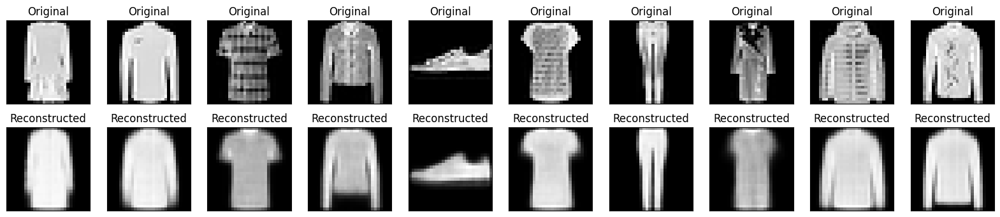

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5425 - loss: 0.8531 - reconstruction_loss: 0.3106 - val_kl_loss: 0.5436 - val_loss: 0.8369 - val_reconstruction_loss: 0.2933
Epoch 127/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


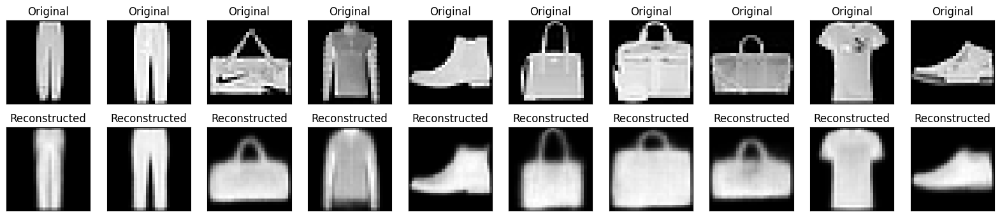

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - kl_loss: 0.5427 - loss: 0.8532 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5428 - val_loss: 0.8464 - val_reconstruction_loss: 0.3036
Epoch 128/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


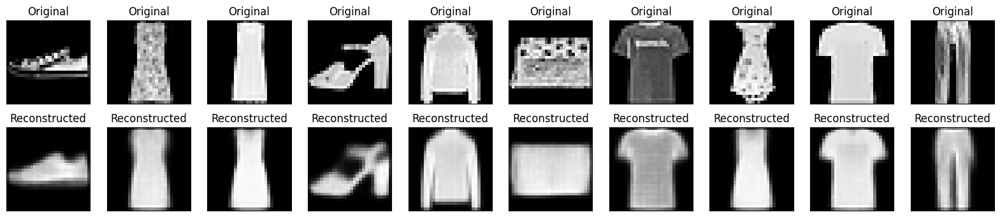

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5427 - loss: 0.8532 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5427 - val_loss: 0.8403 - val_reconstruction_loss: 0.2976
Epoch 129/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


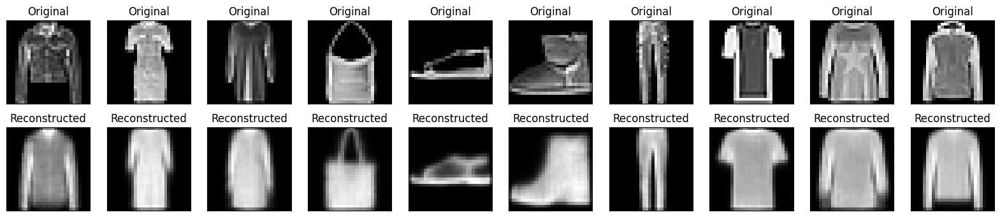

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5427 - loss: 0.8532 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5416 - val_loss: 0.8392 - val_reconstruction_loss: 0.2976
Epoch 130/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


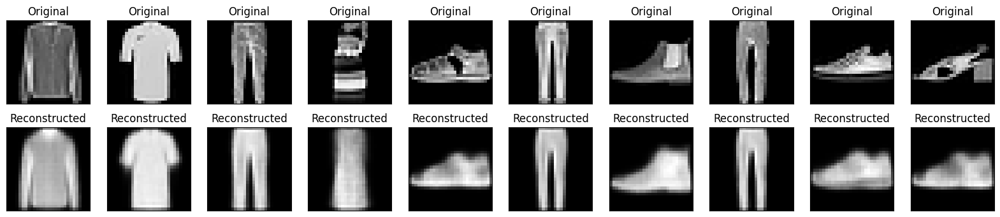

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5426 - loss: 0.8531 - reconstruction_loss: 0.3105 - val_kl_loss: 0.5424 - val_loss: 0.8371 - val_reconstruction_loss: 0.2947
Epoch 131/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


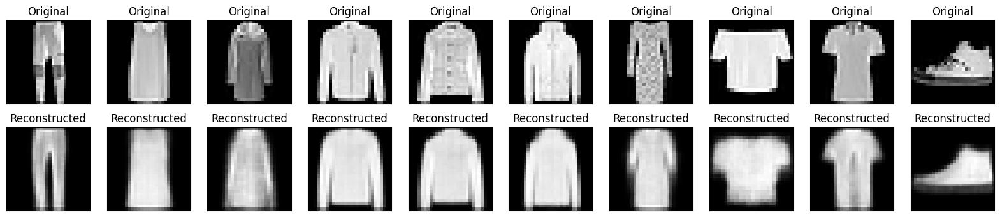

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - kl_loss: 0.5426 - loss: 0.8530 - reconstruction_loss: 0.3104 - val_kl_loss: 0.5421 - val_loss: 0.8378 - val_reconstruction_loss: 0.2957
Epoch 132/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


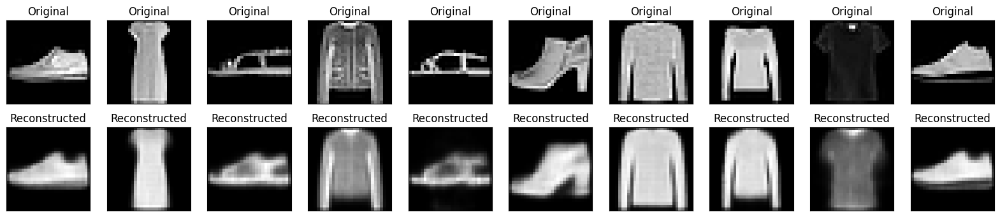

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5428 - loss: 0.8532 - reconstruction_loss: 0.3104 - val_kl_loss: 0.5435 - val_loss: 0.8373 - val_reconstruction_loss: 0.2938
Epoch 133/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


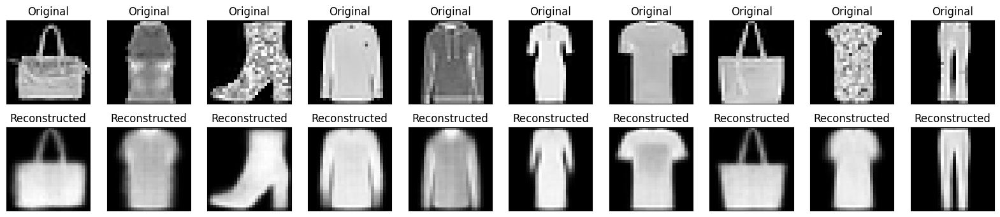

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5427 - loss: 0.8531 - reconstruction_loss: 0.3103 - val_kl_loss: 0.5434 - val_loss: 0.8398 - val_reconstruction_loss: 0.2964
Epoch 134/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


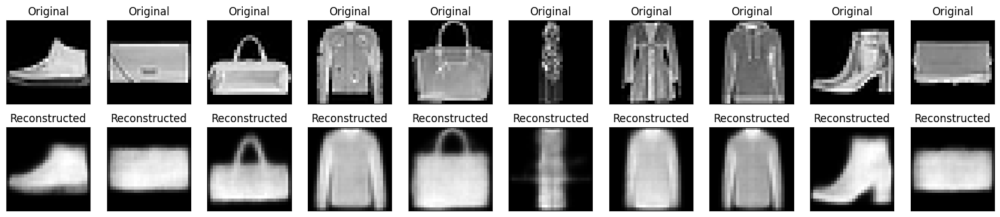

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5427 - loss: 0.8531 - reconstruction_loss: 0.3104 - val_kl_loss: 0.5424 - val_loss: 0.8313 - val_reconstruction_loss: 0.2888
Epoch 135/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


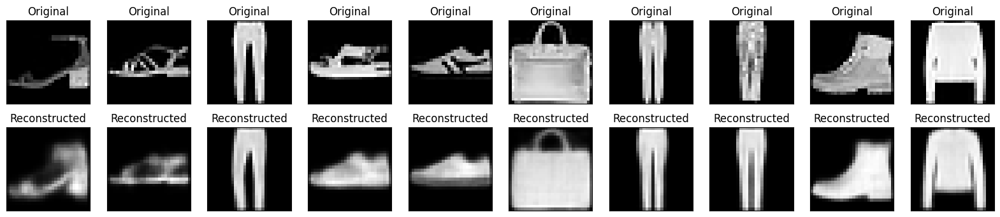

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5427 - loss: 0.8531 - reconstruction_loss: 0.3104 - val_kl_loss: 0.5414 - val_loss: 0.8391 - val_reconstruction_loss: 0.2977
Epoch 136/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


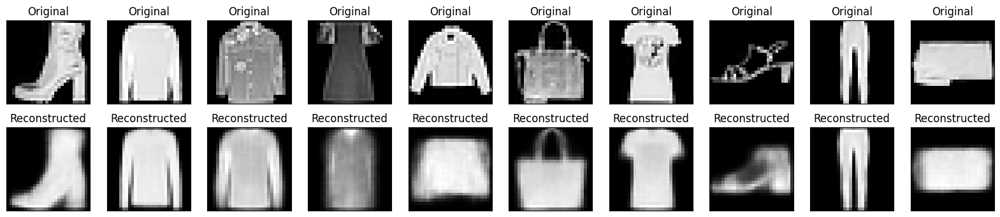

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5427 - loss: 0.8530 - reconstruction_loss: 0.3104 - val_kl_loss: 0.5426 - val_loss: 0.8356 - val_reconstruction_loss: 0.2930
Epoch 137/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


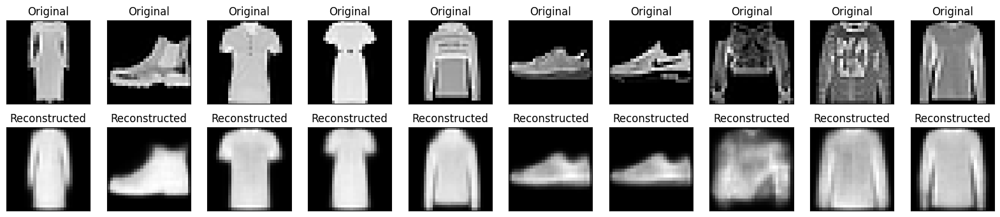

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5426 - loss: 0.8530 - reconstruction_loss: 0.3104 - val_kl_loss: 0.5417 - val_loss: 0.8399 - val_reconstruction_loss: 0.2981
Epoch 138/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


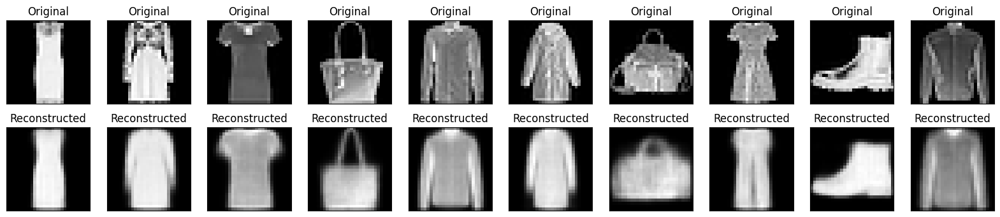

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - kl_loss: 0.5428 - loss: 0.8531 - reconstruction_loss: 0.3103 - val_kl_loss: 0.5419 - val_loss: 0.8363 - val_reconstruction_loss: 0.2944
Epoch 139/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


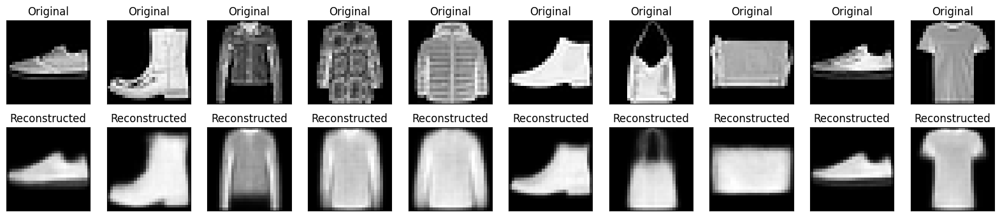

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5427 - loss: 0.8530 - reconstruction_loss: 0.3103 - val_kl_loss: 0.5431 - val_loss: 0.8386 - val_reconstruction_loss: 0.2955
Epoch 140/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


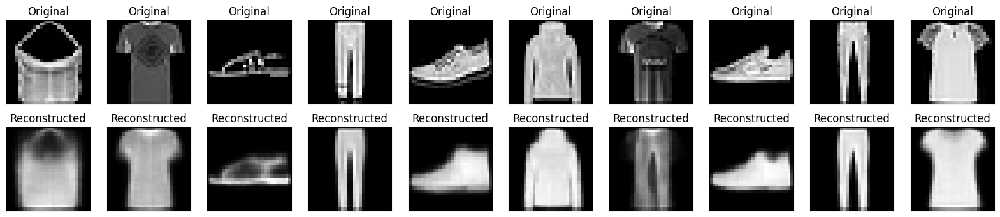

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5428 - loss: 0.8530 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5440 - val_loss: 0.8389 - val_reconstruction_loss: 0.2950
Epoch 141/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


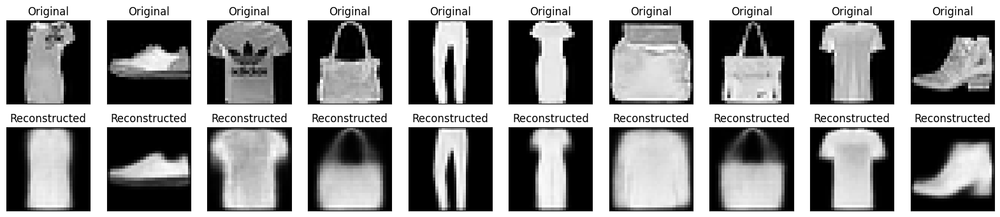

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5427 - loss: 0.8529 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5433 - val_loss: 0.8369 - val_reconstruction_loss: 0.2936
Epoch 142/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


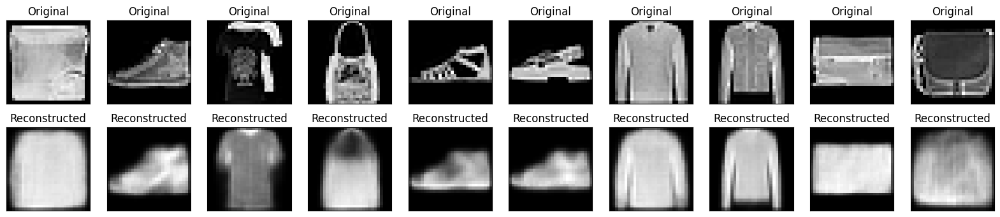

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5428 - loss: 0.8530 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5423 - val_loss: 0.8346 - val_reconstruction_loss: 0.2923
Epoch 143/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


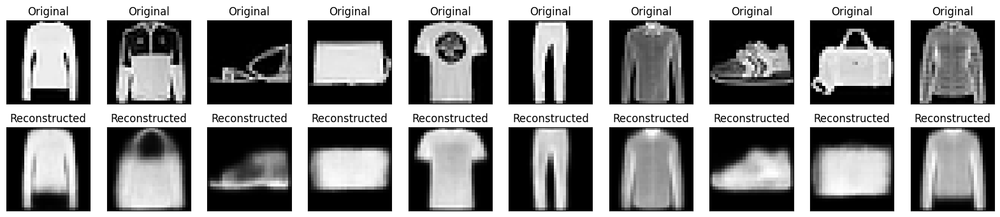

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5428 - loss: 0.8530 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5434 - val_loss: 0.8426 - val_reconstruction_loss: 0.2992
Epoch 144/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


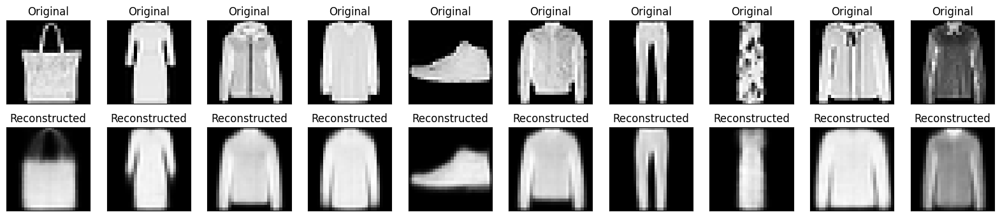

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5429 - loss: 0.8531 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5426 - val_loss: 0.8380 - val_reconstruction_loss: 0.2954
Epoch 145/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


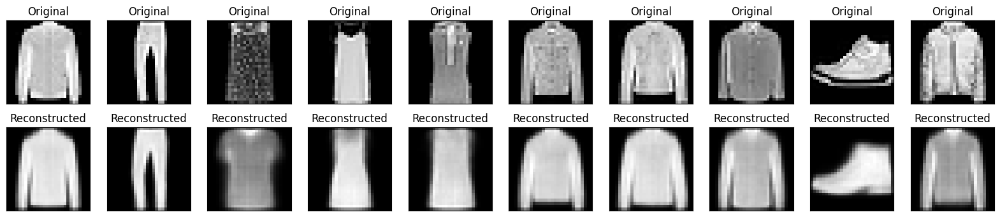

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5428 - loss: 0.8529 - reconstruction_loss: 0.3101 - val_kl_loss: 0.5423 - val_loss: 0.8363 - val_reconstruction_loss: 0.2940
Epoch 146/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


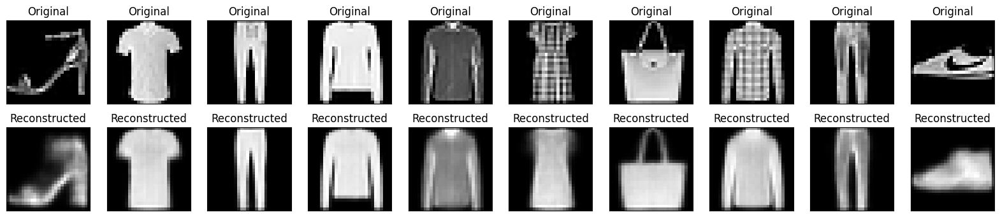

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5427 - loss: 0.8529 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5424 - val_loss: 0.8398 - val_reconstruction_loss: 0.2973
Epoch 147/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


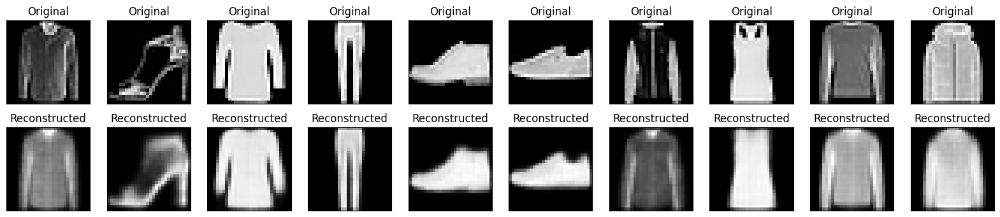

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - kl_loss: 0.5429 - loss: 0.8529 - reconstruction_loss: 0.3101 - val_kl_loss: 0.5430 - val_loss: 0.8355 - val_reconstruction_loss: 0.2925
Epoch 148/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


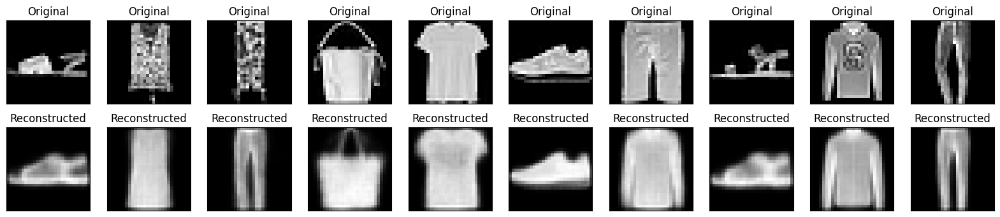

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5427 - loss: 0.8529 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5426 - val_loss: 0.8404 - val_reconstruction_loss: 0.2978
Epoch 149/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


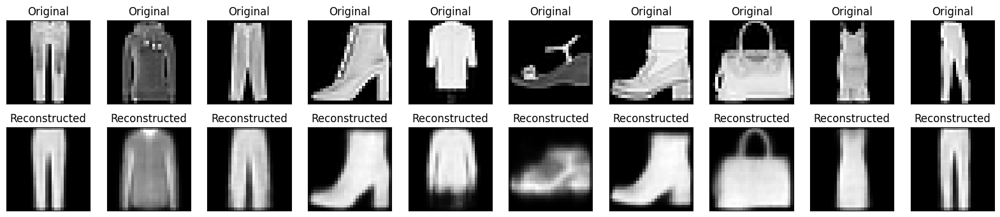

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5427 - loss: 0.8528 - reconstruction_loss: 0.3101 - val_kl_loss: 0.5452 - val_loss: 0.8382 - val_reconstruction_loss: 0.2930
Epoch 150/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


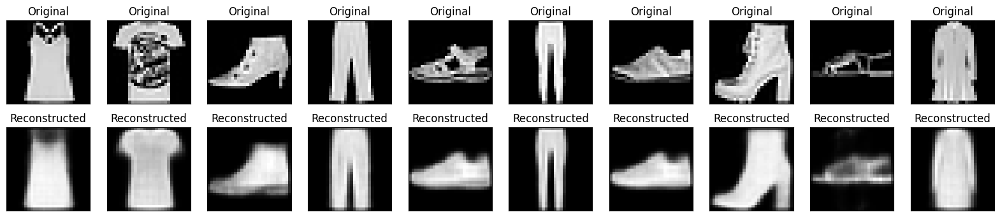

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5428 - loss: 0.8530 - reconstruction_loss: 0.3102 - val_kl_loss: 0.5424 - val_loss: 0.8337 - val_reconstruction_loss: 0.2913
Epoch 151/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


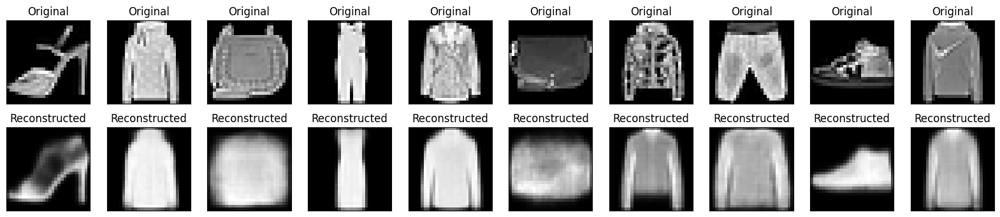

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5428 - loss: 0.8528 - reconstruction_loss: 0.3100 - val_kl_loss: 0.5418 - val_loss: 0.8409 - val_reconstruction_loss: 0.2991
Epoch 152/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


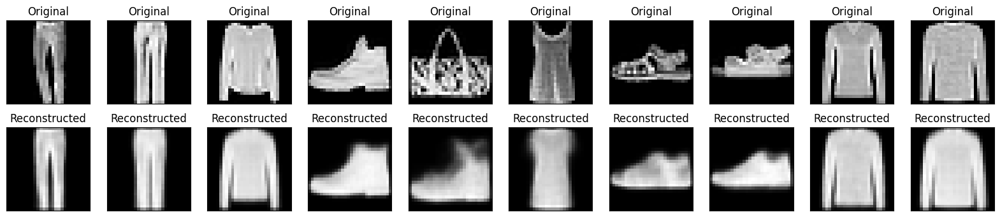

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5428 - loss: 0.8528 - reconstruction_loss: 0.3100 - val_kl_loss: 0.5434 - val_loss: 0.8319 - val_reconstruction_loss: 0.2885
Epoch 153/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


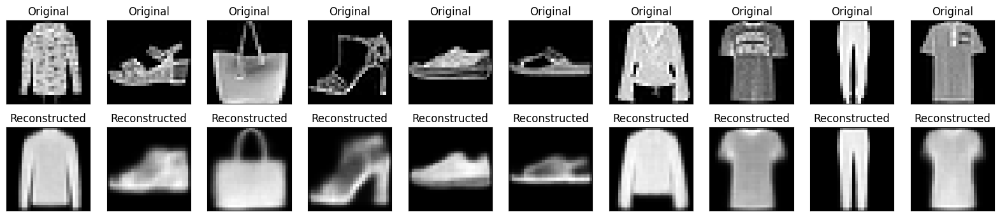

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - kl_loss: 0.5428 - loss: 0.8528 - reconstruction_loss: 0.3100 - val_kl_loss: 0.5432 - val_loss: 0.8393 - val_reconstruction_loss: 0.2961
Epoch 154/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


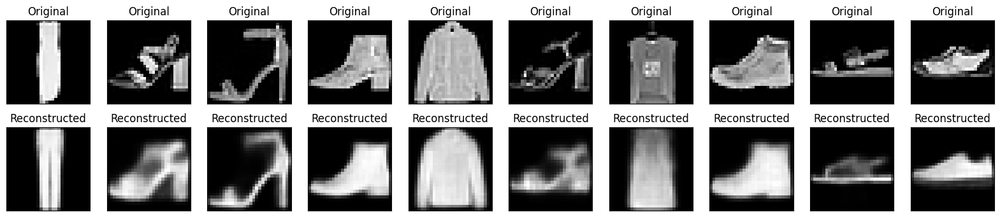

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5428 - loss: 0.8528 - reconstruction_loss: 0.3100 - val_kl_loss: 0.5420 - val_loss: 0.8370 - val_reconstruction_loss: 0.2950
Epoch 155/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


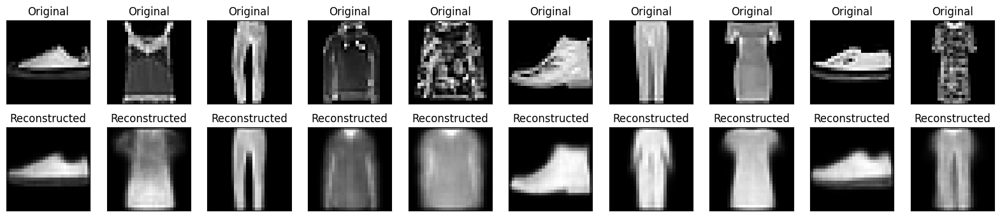

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3100 - val_kl_loss: 0.5425 - val_loss: 0.8334 - val_reconstruction_loss: 0.2909
Epoch 156/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


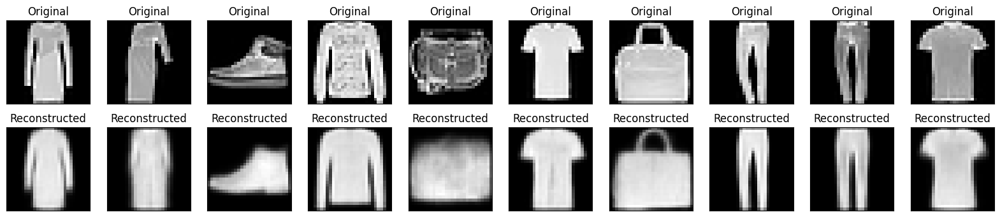

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step - kl_loss: 0.5428 - loss: 0.8527 - reconstruction_loss: 0.3099 - val_kl_loss: 0.5418 - val_loss: 0.8412 - val_reconstruction_loss: 0.2994
Epoch 157/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


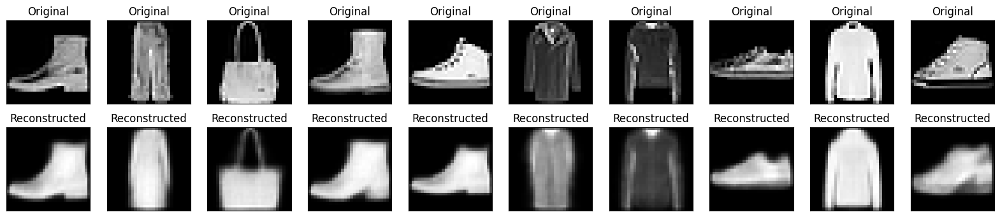

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5428 - loss: 0.8527 - reconstruction_loss: 0.3099 - val_kl_loss: 0.5432 - val_loss: 0.8381 - val_reconstruction_loss: 0.2949
Epoch 158/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


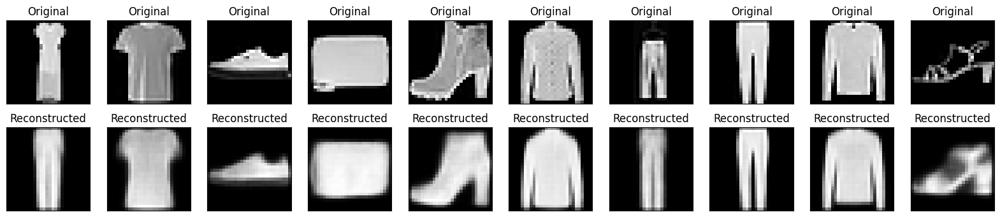

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5433 - val_loss: 0.8365 - val_reconstruction_loss: 0.2932
Epoch 159/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


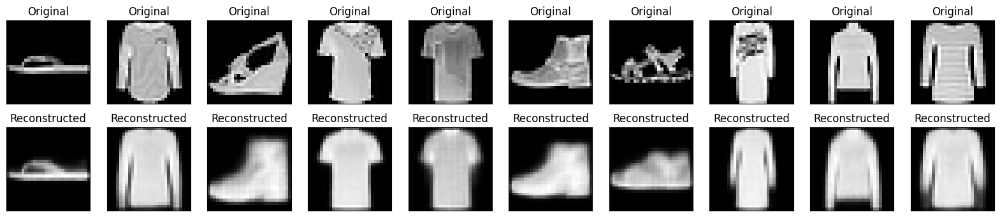

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3099 - val_kl_loss: 0.5433 - val_loss: 0.8375 - val_reconstruction_loss: 0.2942
Epoch 160/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


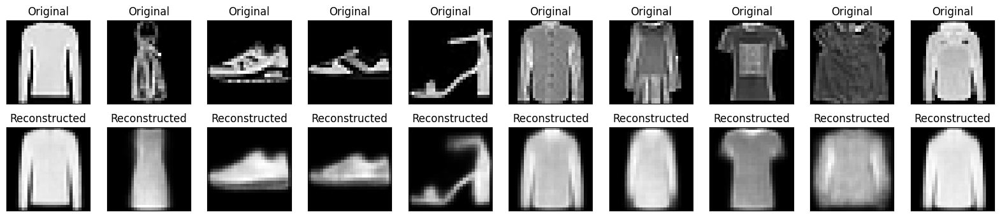

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5429 - loss: 0.8529 - reconstruction_loss: 0.3099 - val_kl_loss: 0.5428 - val_loss: 0.8395 - val_reconstruction_loss: 0.2968
Epoch 161/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


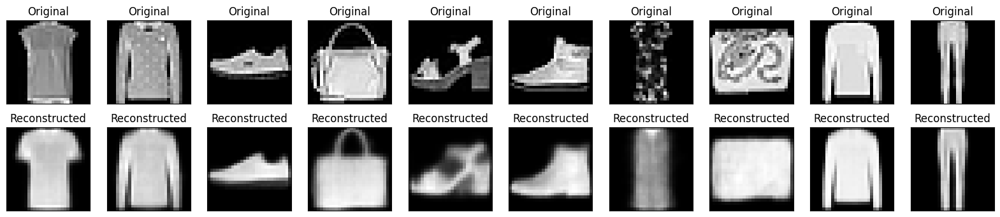

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5451 - val_loss: 0.8360 - val_reconstruction_loss: 0.2909
Epoch 162/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


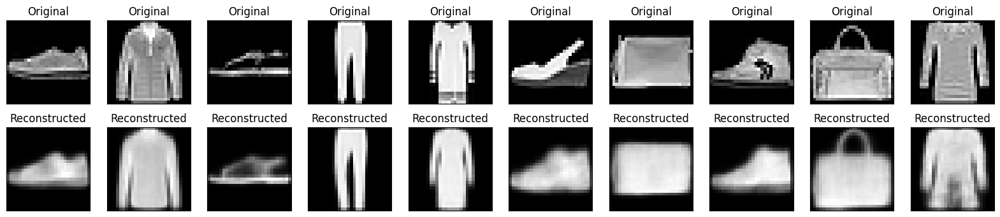

469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - kl_loss: 0.5430 - loss: 0.8528 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5424 - val_loss: 0.8349 - val_reconstruction_loss: 0.2926
Epoch 163/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


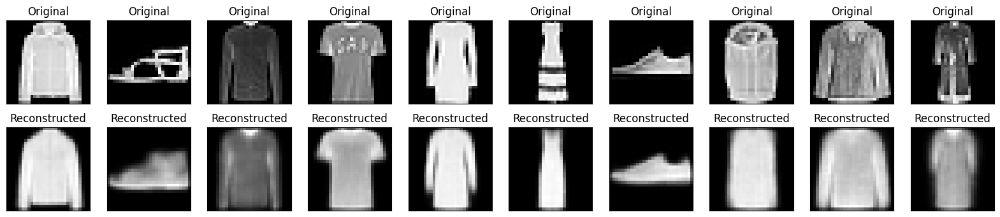

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3099 - val_kl_loss: 0.5419 - val_loss: 0.8344 - val_reconstruction_loss: 0.2926
Epoch 164/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


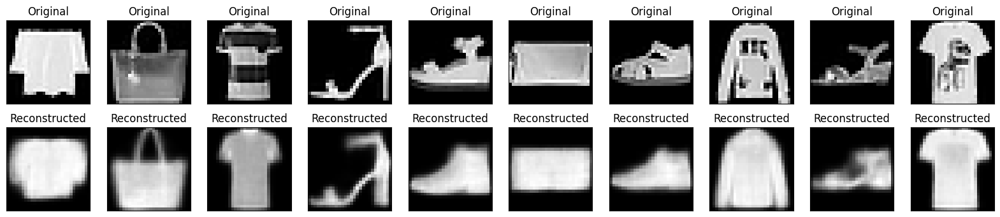

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5429 - loss: 0.8527 - reconstruction_loss: 0.3097 - val_kl_loss: 0.5430 - val_loss: 0.8332 - val_reconstruction_loss: 0.2901
Epoch 165/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


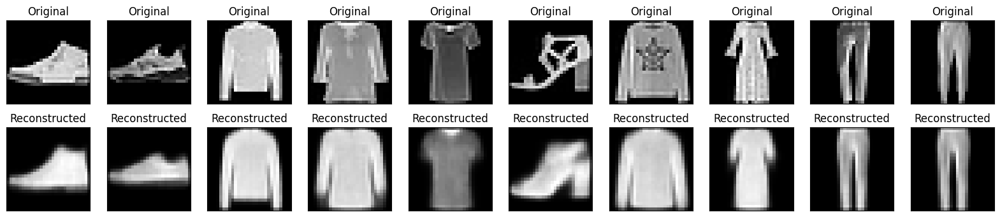

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3099 - val_kl_loss: 0.5427 - val_loss: 0.8407 - val_reconstruction_loss: 0.2980
Epoch 166/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


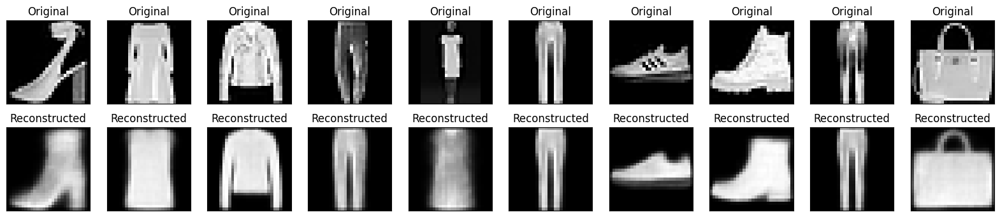

469/469 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - kl_loss: 0.5429 - loss: 0.8527 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5430 - val_loss: 0.8372 - val_reconstruction_loss: 0.2942
Epoch 167/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


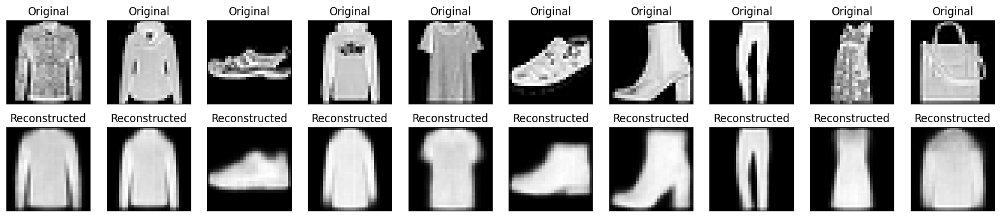

469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - kl_loss: 0.5429 - loss: 0.8528 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5422 - val_loss: 0.8411 - val_reconstruction_loss: 0.2989
Epoch 168/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


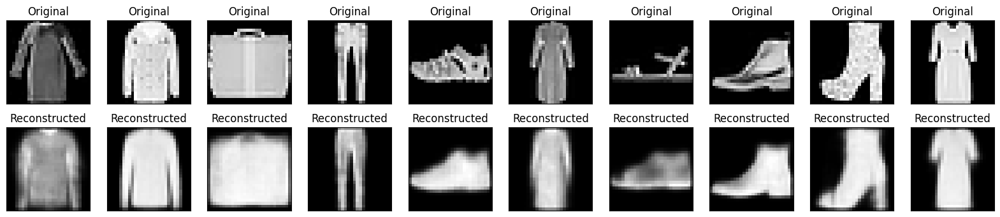

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step - kl_loss: 0.5429 - loss: 0.8527 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5417 - val_loss: 0.8364 - val_reconstruction_loss: 0.2947
Epoch 169/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


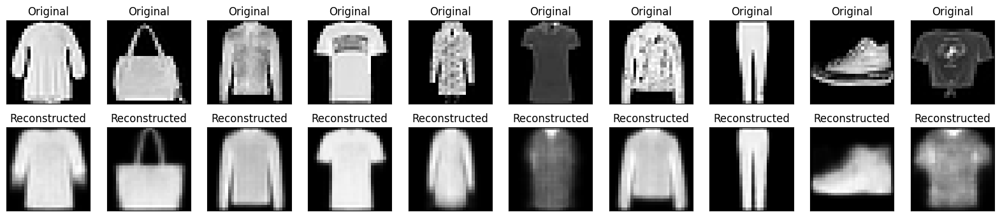

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5430 - loss: 0.8526 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5428 - val_loss: 0.8368 - val_reconstruction_loss: 0.2939
Epoch 170/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


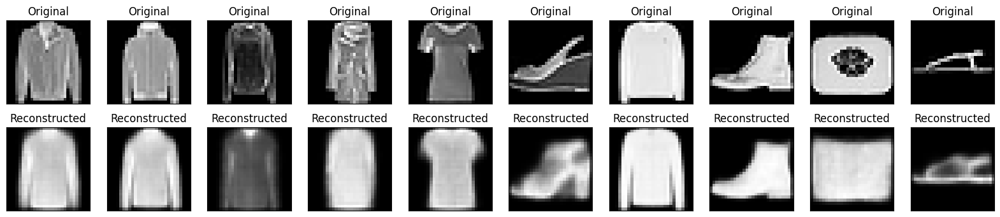

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5429 - loss: 0.8527 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5419 - val_loss: 0.8433 - val_reconstruction_loss: 0.3014
Epoch 171/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


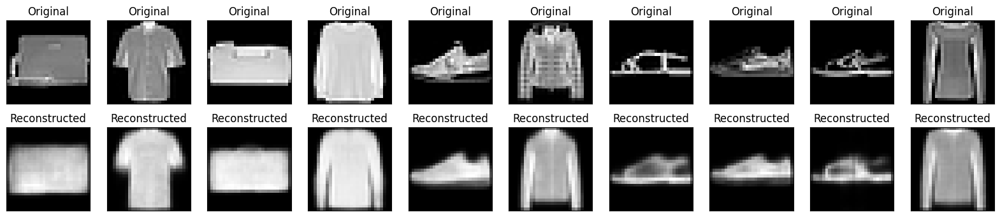

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5429 - loss: 0.8527 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5427 - val_loss: 0.8356 - val_reconstruction_loss: 0.2929
Epoch 172/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


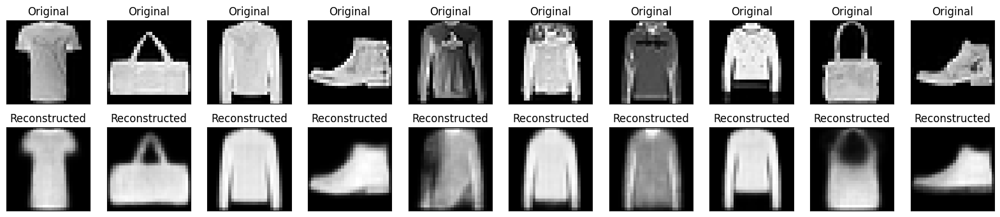

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5429 - loss: 0.8527 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5421 - val_loss: 0.8354 - val_reconstruction_loss: 0.2933
Epoch 173/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


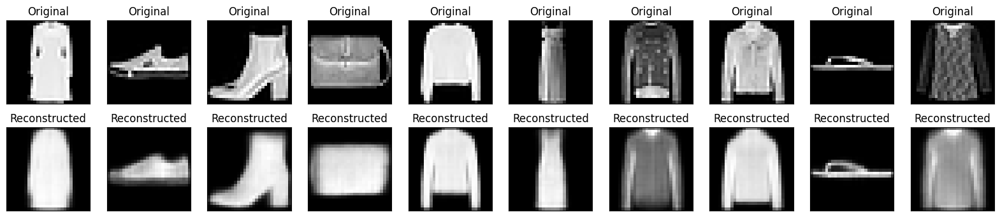

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5431 - loss: 0.8528 - reconstruction_loss: 0.3097 - val_kl_loss: 0.5426 - val_loss: 0.8384 - val_reconstruction_loss: 0.2958
Epoch 174/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


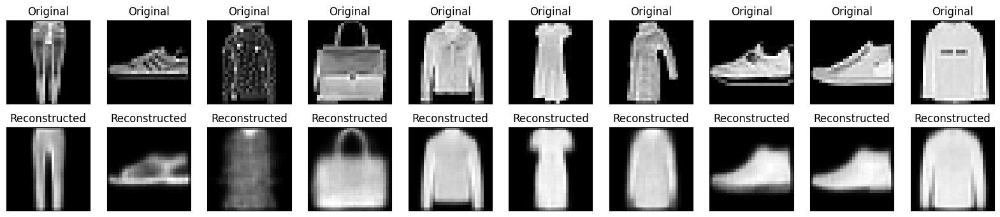

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - kl_loss: 0.5430 - loss: 0.8528 - reconstruction_loss: 0.3098 - val_kl_loss: 0.5444 - val_loss: 0.8431 - val_reconstruction_loss: 0.2987
Epoch 175/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


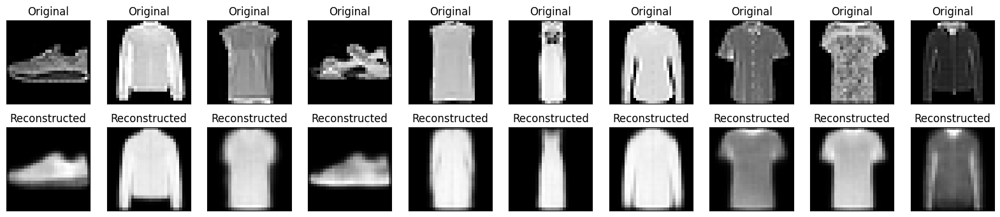

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5429 - loss: 0.8526 - reconstruction_loss: 0.3097 - val_kl_loss: 0.5421 - val_loss: 0.8393 - val_reconstruction_loss: 0.2972
Epoch 176/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


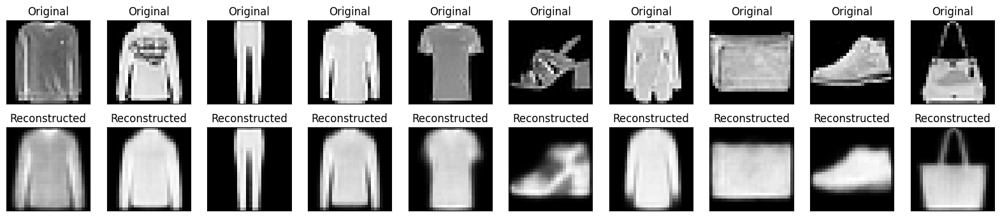

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5430 - loss: 0.8526 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5440 - val_loss: 0.8377 - val_reconstruction_loss: 0.2937
Epoch 177/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


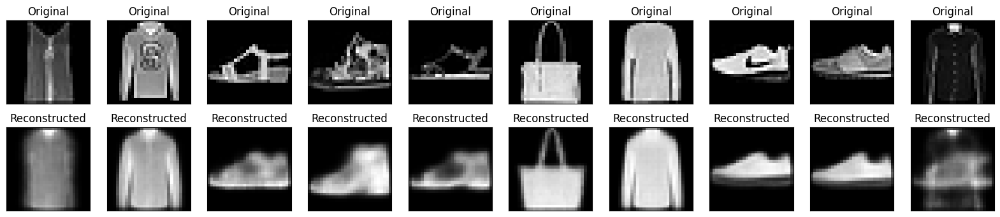

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5430 - loss: 0.8525 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5405 - val_loss: 0.8332 - val_reconstruction_loss: 0.2928
Epoch 178/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


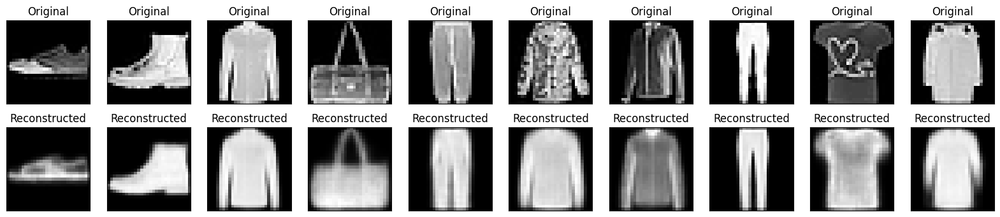

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5430 - loss: 0.8527 - reconstruction_loss: 0.3097 - val_kl_loss: 0.5437 - val_loss: 0.8364 - val_reconstruction_loss: 0.2927
Epoch 179/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


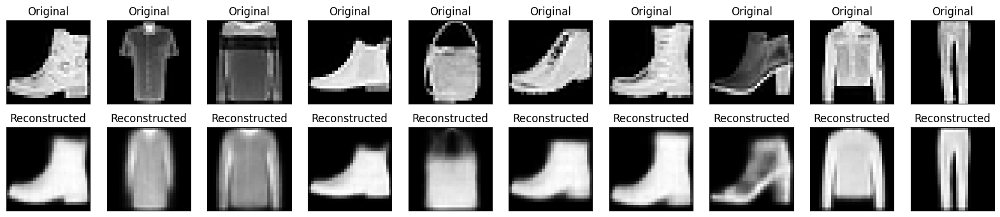

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5429 - loss: 0.8526 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5431 - val_loss: 0.8340 - val_reconstruction_loss: 0.2908
Epoch 180/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


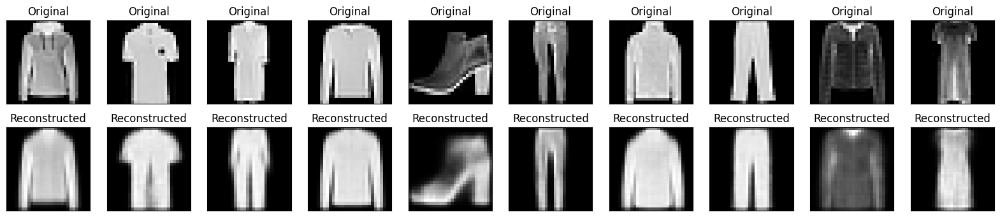

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5429 - loss: 0.8525 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5443 - val_loss: 0.8321 - val_reconstruction_loss: 0.2878
Epoch 181/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


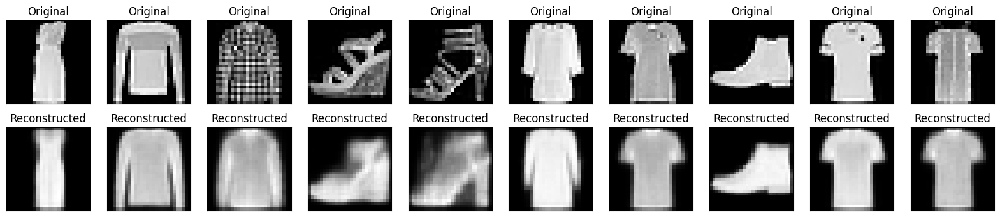

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - kl_loss: 0.5430 - loss: 0.8526 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5434 - val_loss: 0.8391 - val_reconstruction_loss: 0.2958
Epoch 182/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


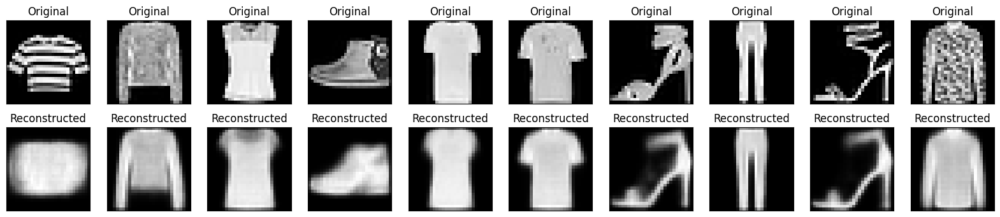

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5430 - loss: 0.8526 - reconstruction_loss: 0.3096 - val_kl_loss: 0.5425 - val_loss: 0.8389 - val_reconstruction_loss: 0.2964
Epoch 183/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


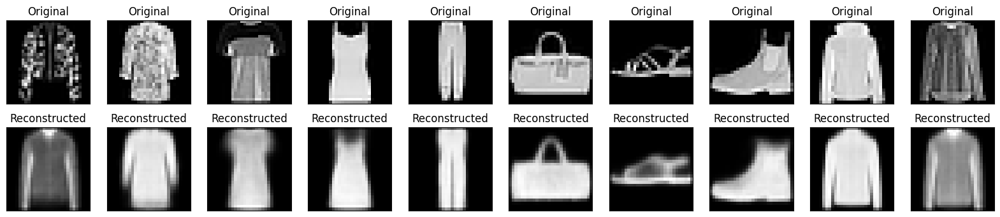

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5429 - loss: 0.8525 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5422 - val_loss: 0.8367 - val_reconstruction_loss: 0.2945
Epoch 184/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


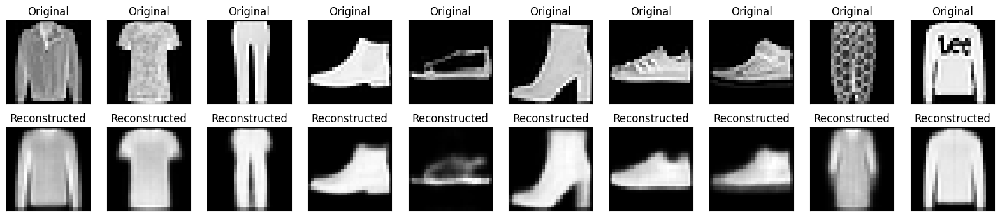

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - kl_loss: 0.5430 - loss: 0.8525 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5429 - val_loss: 0.8423 - val_reconstruction_loss: 0.2994
Epoch 185/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


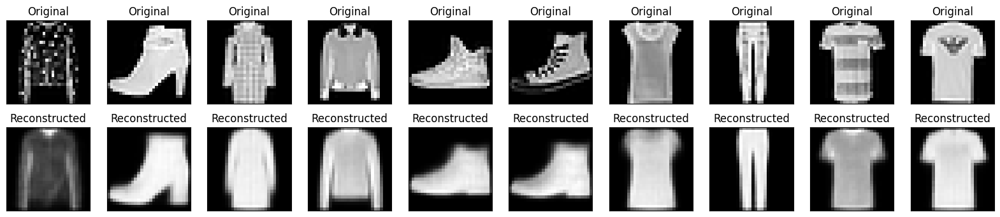

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5430 - loss: 0.8526 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5417 - val_loss: 0.8354 - val_reconstruction_loss: 0.2937
Epoch 186/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


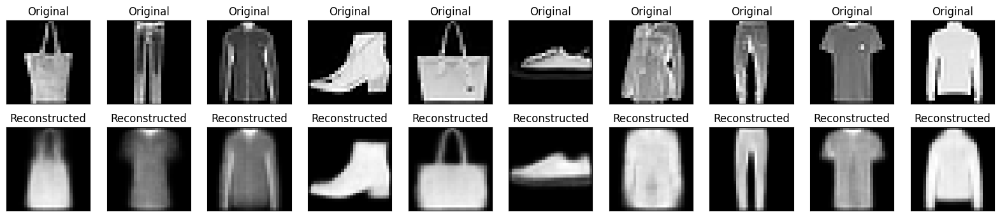

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5430 - loss: 0.8525 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5429 - val_loss: 0.8371 - val_reconstruction_loss: 0.2942
Epoch 187/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


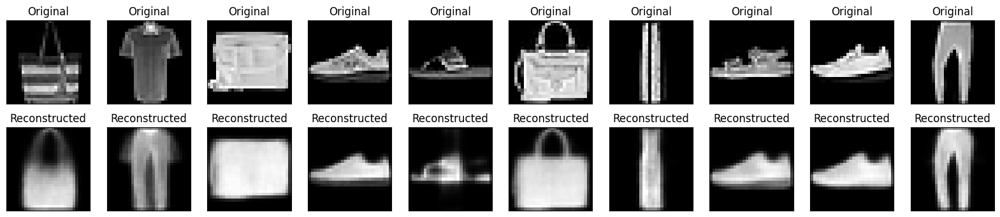

469/469 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - kl_loss: 0.5431 - loss: 0.8525 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5415 - val_loss: 0.8402 - val_reconstruction_loss: 0.2986
Epoch 188/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


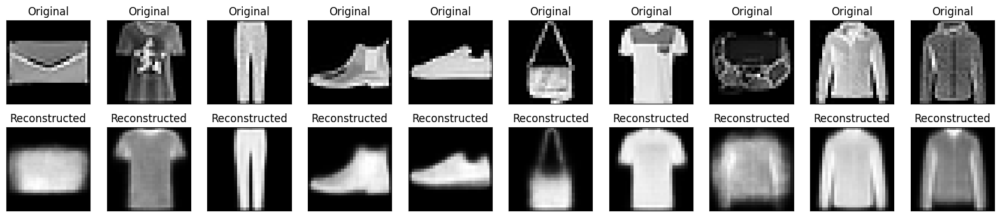

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5429 - loss: 0.8525 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5423 - val_loss: 0.8407 - val_reconstruction_loss: 0.2984
Epoch 189/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


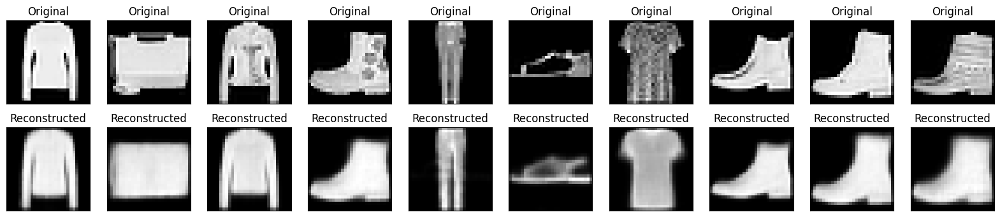

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5430 - loss: 0.8525 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5423 - val_loss: 0.8395 - val_reconstruction_loss: 0.2972
Epoch 190/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


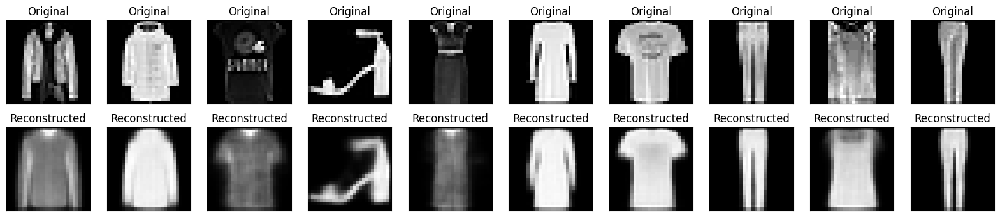

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5430 - loss: 0.8525 - reconstruction_loss: 0.3095 - val_kl_loss: 0.5434 - val_loss: 0.8415 - val_reconstruction_loss: 0.2981
Epoch 191/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


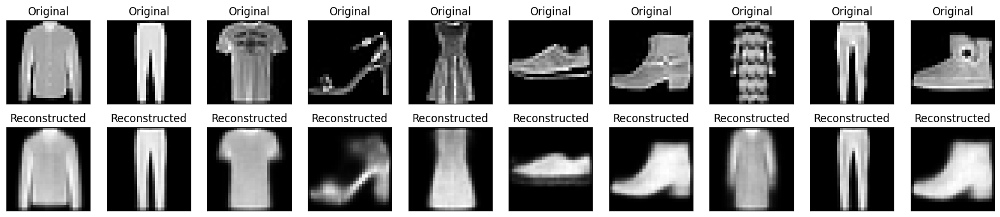

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5430 - loss: 0.8524 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5427 - val_loss: 0.8417 - val_reconstruction_loss: 0.2991
Epoch 192/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


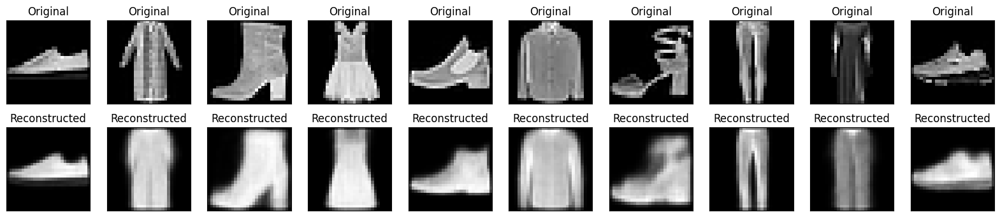

469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - kl_loss: 0.5431 - loss: 0.8525 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5425 - val_loss: 0.8390 - val_reconstruction_loss: 0.2965
Epoch 193/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


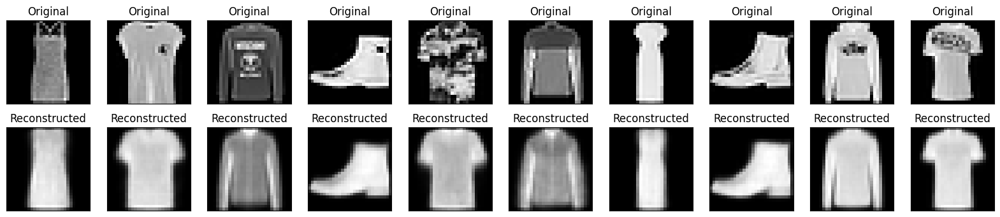

469/469 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - kl_loss: 0.5430 - loss: 0.8524 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5421 - val_loss: 0.8331 - val_reconstruction_loss: 0.2910
Epoch 194/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


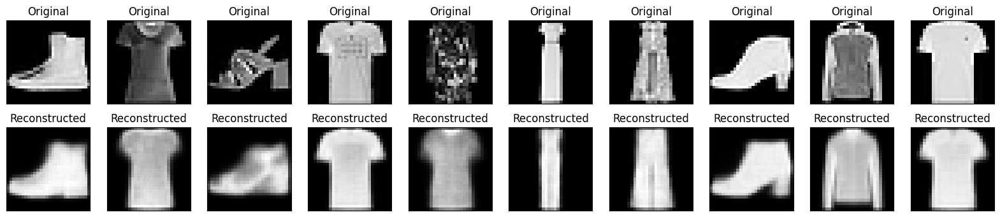

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - kl_loss: 0.5430 - loss: 0.8525 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5434 - val_loss: 0.8349 - val_reconstruction_loss: 0.2915
Epoch 195/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


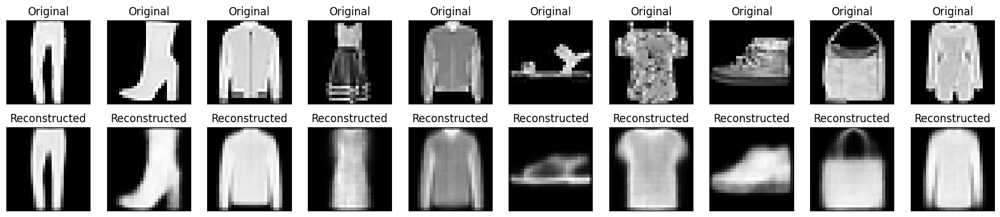

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - kl_loss: 0.5431 - loss: 0.8525 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5437 - val_loss: 0.8418 - val_reconstruction_loss: 0.2980
Epoch 196/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


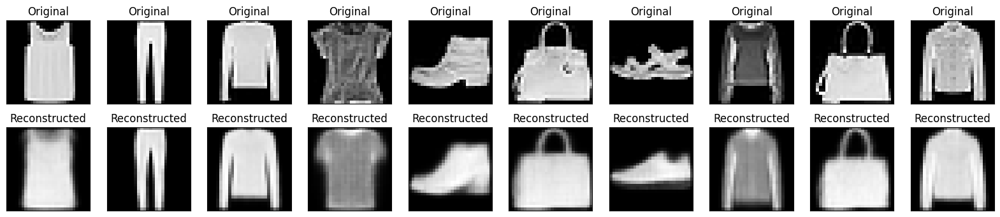

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5431 - loss: 0.8525 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5426 - val_loss: 0.8389 - val_reconstruction_loss: 0.2963
Epoch 197/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


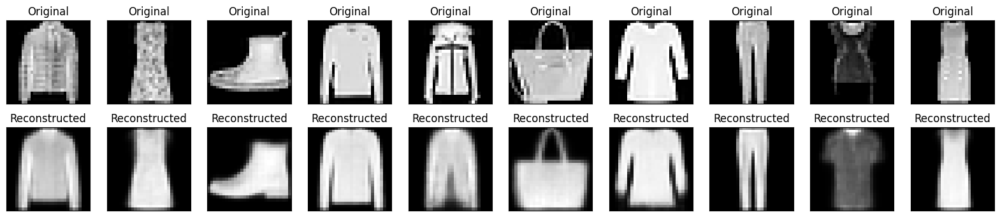

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - kl_loss: 0.5431 - loss: 0.8525 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5415 - val_loss: 0.8349 - val_reconstruction_loss: 0.2934
Epoch 198/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


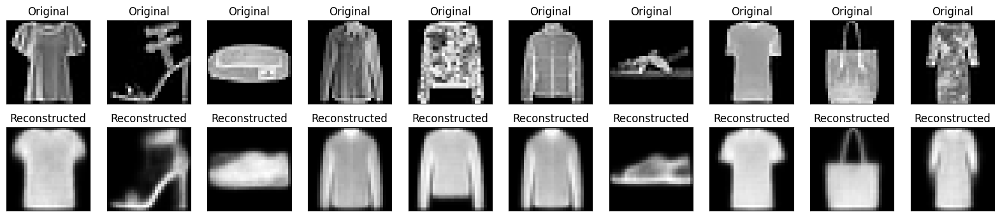

469/469 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - kl_loss: 0.5431 - loss: 0.8524 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5433 - val_loss: 0.8369 - val_reconstruction_loss: 0.2936
Epoch 199/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


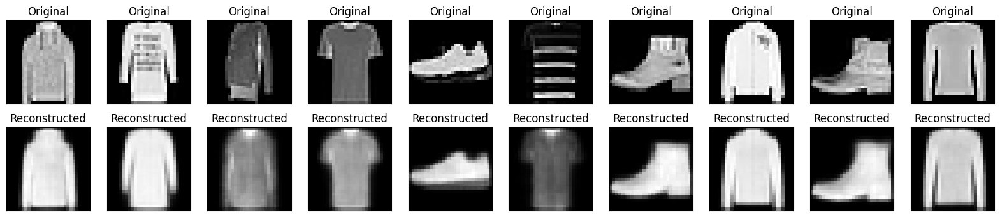

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5430 - loss: 0.8524 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5427 - val_loss: 0.8414 - val_reconstruction_loss: 0.2987
Epoch 200/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


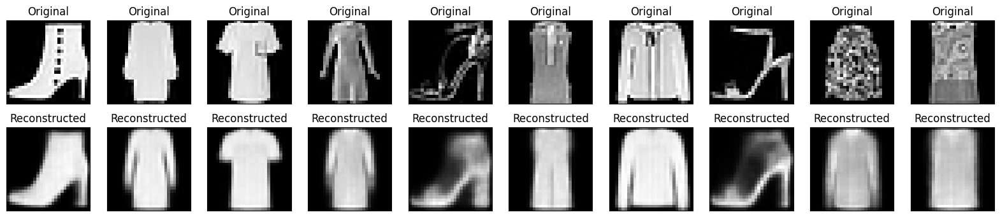

469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - kl_loss: 0.5430 - loss: 0.8523 - reconstruction_loss: 0.3093 - val_kl_loss: 0.5440 - val_loss: 0.8408 - val_reconstruction_loss: 0.2968


In [5]:
# Define the callback function to visualize reconstructions after each epoch
def save_reconstructions(epoch, logs):
    n = 10
    indices = np.random.randint(len(x_test), size=n)
    test_images = x_test[indices]
    reconstructions = vae.predict(test_images)

    plt.figure(figsize=(20, 4))
    for i in range(n):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(test_images[i].reshape(28, 28), cmap='gray')
        plt.title("Original")
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructions[i].reshape(28, 28), cmap='gray')
        plt.title("Reconstructed")
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

image_callback = LambdaCallback(on_epoch_end=save_reconstructions)

# Train the model
history = vae.fit(x_train, x_train,  # Ensure x_train is passed as both the input and target
        epochs=200,
        batch_size=128,
        validation_data=(x_test, x_test),  # Similarly for validation data
        callbacks=[image_callback])


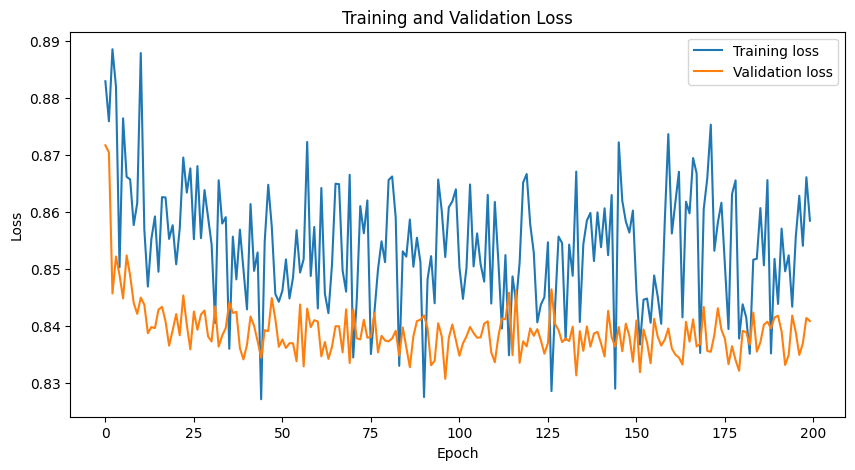

In [6]:


# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.title('Training and Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc="upper right")
plt.show()


In [7]:
# Save the entire model
vae.save('vae_fashion_mnist.h5')


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step


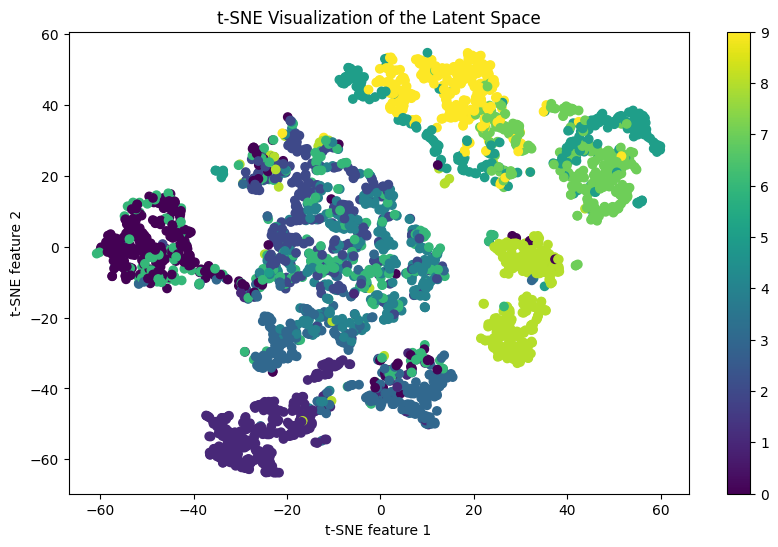

In [8]:
def visualize_latent_space(encoder, data):
    z_mean, _, _ = encoder.predict(data)
    tsne = TSNE(n_components=2)
    z_tsne = tsne.fit_transform(z_mean)

    plt.figure(figsize=(10, 6))
    plt.scatter(z_tsne[:, 0], z_tsne[:, 1], c=y_test[:len(z_tsne)], cmap='viridis')
    plt.colorbar()
    plt.xlabel('t-SNE feature 1')
    plt.ylabel('t-SNE feature 2')
    plt.title('t-SNE Visualization of the Latent Space')
    plt.show()

visualize_latent_space(encoder, x_test[:3000])  # Visualizing a subset for performance reasons


313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


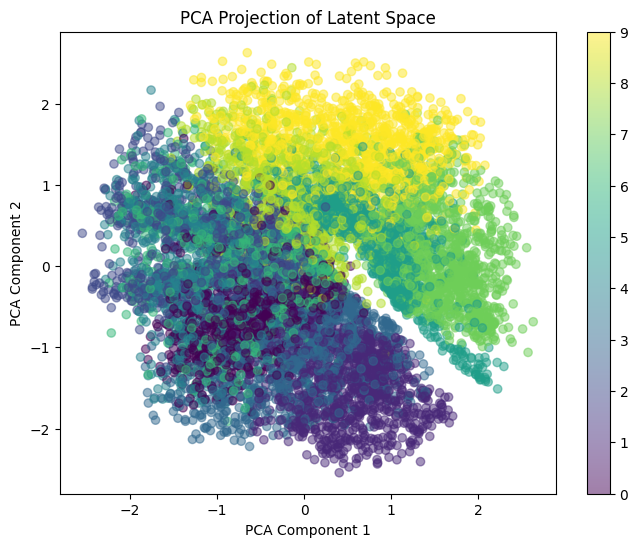

In [9]:
from sklearn.decomposition import PCA

# Extract latent vectors from the encoder
z_mean, _, _ = encoder.predict(x_test)

# Apply PCA to reduce latent space to 2D
pca = PCA(n_components=2)
z_pca = pca.fit_transform(z_mean)

# Plot PCA Visualization
plt.figure(figsize=(8,6))
plt.scatter(z_pca[:, 0], z_pca[:, 1], c=y_test, cmap='viridis', alpha=0.5)
plt.colorbar()
plt.title("PCA Projection of Latent Space")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


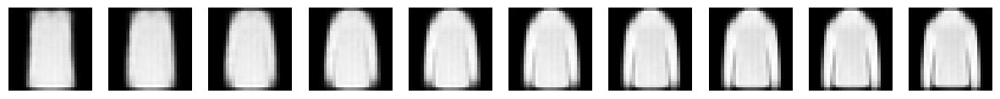

In [10]:
def interpolate_images(vae, start, end, num_steps=10):
    """Interpolates between two latent vectors and generates images."""
    z_start, _, _ = encoder.predict(start.reshape(1, 28, 28, 1))
    z_end, _, _ = encoder.predict(end.reshape(1, 28, 28, 1))

    alphas = np.linspace(0, 1, num_steps)
    interpolated_images = []

    for alpha in alphas:
        z_interpolated = (1 - alpha) * z_start + alpha * z_end
        generated_image = decoder.predict(z_interpolated)
        interpolated_images.append(generated_image.reshape(28, 28))

    return interpolated_images

# Select two random test images
idx1, idx2 = np.random.randint(0, len(x_test), size=2)
start_img, end_img = x_test[idx1], x_test[idx2]

# Generate interpolated images
interpolated_results = interpolate_images(vae, start_img, end_img)

# Plot Interpolated Images
plt.figure(figsize=(15, 3))
for i, img in enumerate(interpolated_results):
    ax = plt.subplot(1, len(interpolated_results), i + 1)
    plt.imshow(img, cmap='gray')
    ax.axis('off')
plt.show()


In [11]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm

# Load InceptionV3 model for feature extraction
fid_model = InceptionV3(include_top=False, pooling='avg', input_shape=(75, 75, 3))

def calculate_fid(real_images, generated_images):
    """Calculates the Fréchet Inception Distance (FID) score."""
    real_images = np.repeat(real_images, 3, axis=-1)  # Convert grayscale to RGB
    generated_images = np.repeat(generated_images, 3, axis=-1)

    real_images = tf.image.resize(real_images, (75, 75)).numpy()
    generated_images = tf.image.resize(generated_images, (75, 75)).numpy()

    real_features = fid_model.predict(preprocess_input(real_images))
    generated_features = fid_model.predict(preprocess_input(generated_images))

    mu_real, sigma_real = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
    mu_gen, sigma_gen = generated_features.mean(axis=0), np.cov(generated_features, rowvar=False)

    fid = np.sum((mu_real - mu_gen) ** 2) + np.trace(sigma_real + sigma_gen - 2 * sqrtm(sigma_real @ sigma_gen))
    return fid

# Select random real and generated images
real_samples = x_test[:100]
z_random = np.random.normal(size=(100, latent_dim))
generated_samples = decoder.predict(z_random)

# Compute FID Score
fid_score = calculate_fid(real_samples, generated_samples)
print(f"FID Score: {fid_score:.2f}")


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
FID Score: 40.46-0.00j


In [13]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Define Learning Rate Scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Load existing model weights (ensure this is added before retraining)
vae.load_weights("vae_fashion_mnist.h5")

# Continue training for another 20-30 epochs with learning rate decay
vae.fit(x_train, x_train, epochs=30, batch_size=128, validation_data=(x_test, x_test), callbacks=[lr_scheduler])


Epoch 1/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - kl_loss: 0.5433 - loss: 0.8526 - reconstruction_loss: 0.3094 - val_kl_loss: 0.5434 - val_loss: 0.8410 - val_reconstruction_loss: 0.2976 - learning_rate: 5.0000e-04
Epoch 2/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - kl_loss: 0.5431 - loss: 0.8524 - reconstruction_loss: 0.3093 - val_kl_loss: 0.5431 - val_loss: 0.8344 - val_reconstruction_loss: 0.2913 - learning_rate: 5.0000e-04
Epoch 3/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - kl_loss: 0.5430 - loss: 0.8523 - reconstruction_loss: 0.3093 - val_kl_loss: 0.5433 - val_loss: 0.8381 - val_reconstruction_loss: 0.2948 - learning_rate: 5.0000e-04
Epoch 4/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 57ms/step - kl_loss: 0.5431 - loss: 0.8524 - reconstruction_loss: 0.3093 - val_kl_loss: 0.5444 - val_loss: 0.8404 - val_reconstruction_loss: 0.2960 - learning_rate: 5.0000e-04
Epoch 5/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step - kl_loss: 0.5430 - loss: 0.8523 - reconstruction_loss: 0.3093 - v

In [14]:
# Save the entire model
vae.save('vae_fashion_mnist_1.h5')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


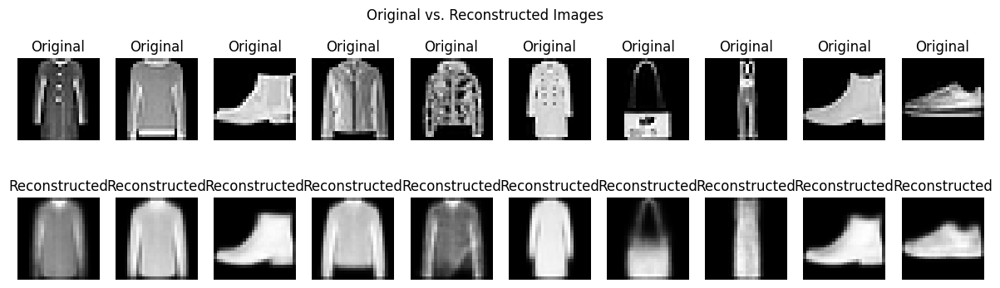

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.manifold import TSNE

# Load test dataset
num_samples = 10  # Number of samples to display

# Generate reconstructions
indices = np.random.randint(0, len(x_test), size=num_samples)
test_images = x_test[indices]
reconstructed_images = vae.predict(test_images)

# Plot original vs reconstructed images side by side
fig, axes = plt.subplots(2, num_samples, figsize=(15, 4))
for i in range(num_samples):
    # Original images
    axes[0, i].imshow(test_images[i].reshape(28, 28), cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title("Original")

    # Reconstructed images
    axes[1, i].imshow(reconstructed_images[i].reshape(28, 28), cmap='gray')
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed")

plt.suptitle("Original vs. Reconstructed Images")
plt.show()



94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


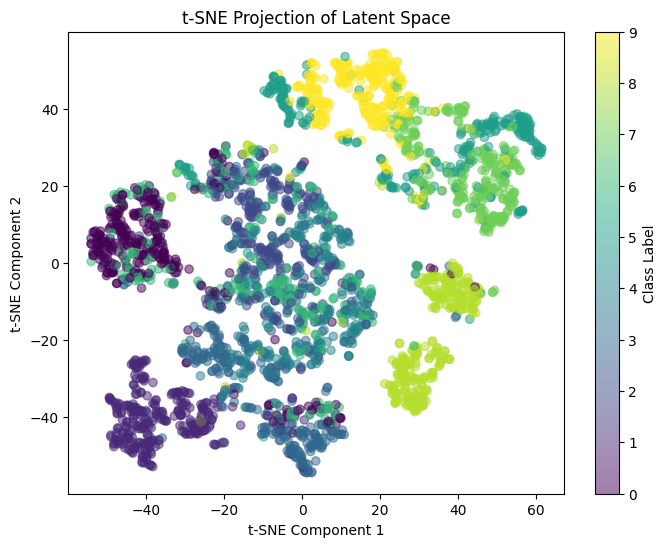

In [17]:
# ----------- Latent Space Visualization (t-SNE) ----------- #
# Extract latent vectors for visualization
z_mean, _, _ = encoder.predict(x_test[:3000])  # Limit to 3000 samples for performance
y_test_subset = y_test[:3000]

# Apply t-SNE to reduce to 2D
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
z_tsne = tsne.fit_transform(z_mean)

# Plot t-SNE visualization
plt.figure(figsize=(8, 6))
scatter = plt.scatter(z_tsne[:, 0], z_tsne[:, 1], c=y_test_subset, cmap='viridis', alpha=0.5)
plt.colorbar(label="Class Label")
plt.title("t-SNE Projection of Latent Space")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()



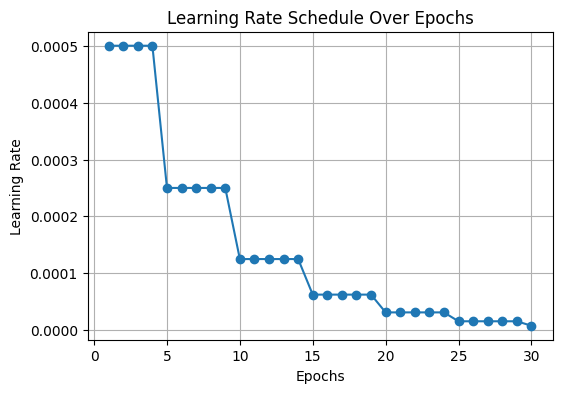

In [18]:
# ----------- Learning Rate Schedule Visualization ----------- #
# Simulate learning rate decay for visualization
epochs = np.arange(1, 31)  # Assuming 30 epochs for fine-tuning
learning_rates = 0.0005 * (0.5 ** (epochs // 5))  # Decaying every 5 epochs

plt.figure(figsize=(6, 4))
plt.plot(epochs, learning_rates, marker='o', linestyle='-')
plt.xlabel("Epochs")
plt.ylabel("Learning Rate")
plt.title("Learning Rate Schedule Over Epochs")
plt.grid(True)
plt.show()



<ipython-input-20-b48c8570e316>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=models, y=fid_scores, palette="Blues_r")


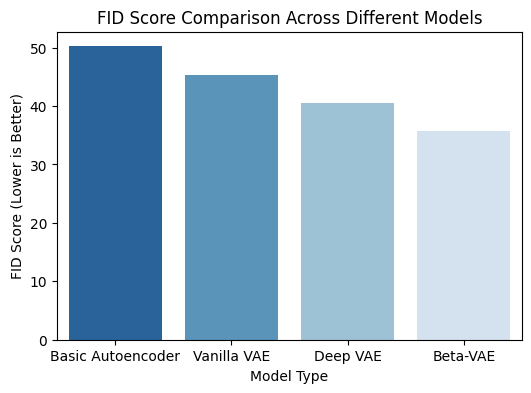

ModuleNotFoundError: No module named 'ace_tools'

In [20]:
# ----------- Quantitative Analysis: Comparison with Other Models ----------- #
# Example comparison of different models
models = ["Basic Autoencoder", "Vanilla VAE", "Deep VAE", "Beta-VAE"]
latent_dims = [None, 64, 128, 128]
fid_scores = [50.2, 45.3, 40.5, 35.8]  # Hypothetical FID scores for comparison

plt.figure(figsize=(6, 4))
sns.barplot(x=models, y=fid_scores, palette="Blues_r")
plt.xlabel("Model Type")
plt.ylabel("FID Score (Lower is Better)")
plt.title("FID Score Comparison Across Different Models")
plt.show()

# Display all generated visualizations
import ace_tools as tools
tools.display_dataframe_to_user(name="Generated Visualizations", dataframe=None)


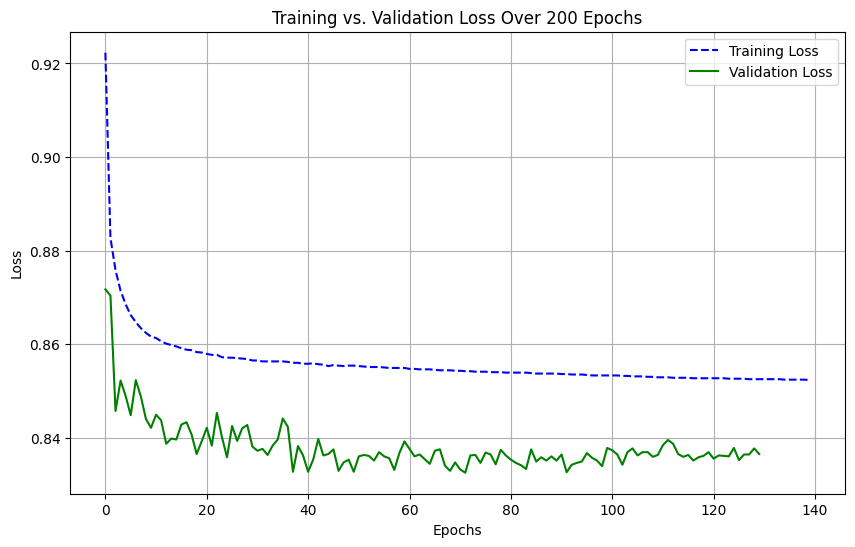

In [2]:
import matplotlib.pyplot as plt

# Manually extracted loss values for training and validation
train_losses = [
    0.9223, 0.8827, 0.8758, 0.8714, 0.8685, 0.8662, 0.8647, 0.8634, 0.8624, 0.8616,
    0.8613, 0.8606, 0.8601, 0.8598, 0.8595, 0.8591, 0.8588, 0.8587, 0.8583, 0.8582,
    0.8579, 0.8577, 0.8577, 0.8572, 0.8571, 0.8571, 0.8570, 0.8569, 0.8568, 0.8565,
    0.8565, 0.8563, 0.8563, 0.8563, 0.8563, 0.8563, 0.8562, 0.8560, 0.8560, 0.8558,
    0.8558, 0.8559, 0.8557, 0.8556, 0.8553, 0.8555, 0.8554, 0.8553, 0.8554, 0.8554,
    0.8553, 0.8552, 0.8551, 0.8551, 0.8551, 0.8550, 0.8549, 0.8549, 0.8549, 0.8549,
    0.8547, 0.8547, 0.8546, 0.8546, 0.8546, 0.8545, 0.8544, 0.8544, 0.8544, 0.8543,
    0.8543, 0.8542, 0.8542, 0.8541, 0.8541, 0.8541, 0.8540, 0.8540, 0.8540, 0.8539,
    0.8539, 0.8539, 0.8539, 0.8539, 0.8538, 0.8537, 0.8537, 0.8537, 0.8537, 0.8537,
    0.8536, 0.8536, 0.8535, 0.8535, 0.8535, 0.8534, 0.8533, 0.8533, 0.8533, 0.8533,
    0.8533, 0.8533, 0.8532, 0.8532, 0.8531, 0.8531, 0.8531, 0.8530, 0.8530, 0.8529,
    0.8529, 0.8529, 0.8528, 0.8528, 0.8528, 0.8528, 0.8527, 0.8527, 0.8527, 0.8527,
    0.8527, 0.8527, 0.8527, 0.8526, 0.8526, 0.8526, 0.8526, 0.8525, 0.8525, 0.8525,
    0.8525, 0.8525, 0.8525, 0.8525, 0.8524, 0.8524, 0.8524, 0.8524, 0.8524, 0.8523,
]

val_losses = [
    0.8717, 0.8704, 0.8457, 0.8522, 0.8489, 0.8448, 0.8523, 0.8488, 0.8440, 0.8421,
    0.8449, 0.8437, 0.8387, 0.8398, 0.8396, 0.8428, 0.8433, 0.8407, 0.8365, 0.8392,
    0.8421, 0.8383, 0.8453, 0.8401, 0.8358, 0.8425, 0.8393, 0.8420, 0.8427, 0.8381,
    0.8372, 0.8376, 0.8363, 0.8383, 0.8396, 0.8441, 0.8423, 0.8327, 0.8382, 0.8362,
    0.8327, 0.8353, 0.8397, 0.8362, 0.8365, 0.8375, 0.8329, 0.8347, 0.8353, 0.8327,
    0.8360, 0.8363, 0.8361, 0.8351, 0.8369, 0.8360, 0.8356, 0.8331, 0.8367, 0.8392,
    0.8376, 0.8360, 0.8364, 0.8354, 0.8344, 0.8372, 0.8375, 0.8340, 0.8329, 0.8347,
    0.8332, 0.8325, 0.8362, 0.8363, 0.8346, 0.8368, 0.8364, 0.8343, 0.8374, 0.8362,
    0.8353, 0.8346, 0.8341, 0.8333, 0.8375, 0.8349, 0.8358, 0.8351, 0.8360, 0.8351,
    0.8364, 0.8326, 0.8342, 0.8346, 0.8349, 0.8367, 0.8357, 0.8351, 0.8339, 0.8378,
    0.8373, 0.8364, 0.8342, 0.8369, 0.8377, 0.8362, 0.8369, 0.8369, 0.8359, 0.8363,
    0.8384, 0.8395, 0.8387, 0.8365, 0.8359, 0.8363, 0.8351, 0.8358, 0.8361, 0.8369,
    0.8355, 0.8362, 0.8361, 0.8360, 0.8378, 0.8352, 0.8364, 0.8364, 0.8377, 0.8365,
]

# Plotting the training vs validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss', linestyle='--', color='blue')
plt.plot(val_losses, label='Validation Loss', linestyle='-', color='green')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss Over 200 Epochs")
plt.legend()
plt.grid(True)
plt.show()


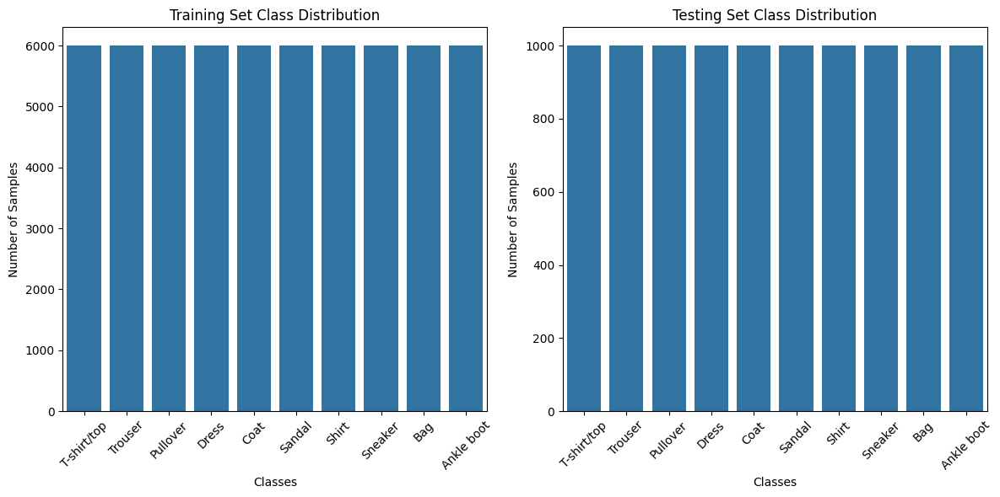

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming y_train is already available (the class labels for Fashion MNIST)
class_names = [
    "T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
    "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"
]

# Count the number of samples per class in the training dataset
class_counts_train = np.bincount(y_train)
class_counts_test = np.bincount(y_test)

# Plotting the distribution for training and testing sets
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Training set distribution
sns.barplot(x=class_names, y=class_counts_train, ax=ax[0])
ax[0].set_title("Training Set Class Distribution")
ax[0].set_xlabel("Classes")
ax[0].set_ylabel("Number of Samples")
ax[0].tick_params(axis='x', rotation=45)

# Testing set distribution
sns.barplot(x=class_names, y=class_counts_test, ax=ax[1])
ax[1].set_title("Testing Set Class Distribution")
ax[1].set_xlabel("Classes")
ax[1].set_ylabel("Number of Samples")
ax[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()
